<a href="https://colab.research.google.com/github/justinjunge/Convergent-Wisdom-Project/blob/main/Github_Copy_of_Copy_of_Agnes_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Welcome to the Convergent Wisdom project! This endeavor seeks to apply natural language processing and sentiment analysis to the study of three prominent religious texts: the Christian Bible, the Muslim Qur'an, and the Hindu Bhagavad Gita. Seeing where these texts converge can provide a fascinating window into human psychology.


This project is split across several notebooks. This notebook uses SentimentIntensityAnalyzer to assess the positivity, negativity, and neutrality of each verse in the Gita, Qur'an, and Bible, extracts and plots a variety of emotional data using SentimentIntensityAnalyzer, and then generates positive and negative emotional word clouds for each chapter in the Gita and Qur'an and each book in the Bible.

This notebook is divided into several sections, as follows.

          1. SentimentIntensityAnalyzer -- Gita
          2. SentimentIntensityAnalyzer -- Bible
          3. SentimentIntensityAnalyzer -- Quran
          4. Word Clouds
          5. Semantic Similarity and Sentiment Visualization

First, we will install vaderSentiment, a natural language processing tool for sentiment analysis.

In [ ]:
!pip install vaderSentiment

After importing the necessary packages, our code allows for mounting of one's personal Google Drive. For this project to be run locally, CSV files containing the Gita, Qur'an, and Bible must be uploaded to one's personal Google Drive for access. These CSVs can be downloaded from the Github repository.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# **1. SentimentIntensityAnalyzer -- Gita**

Importing *Srimad Bhagavad Gita* data from CSV

In [ ]:
# df = pd.read_csv ('/content/gdrive/MyDrive/gita.csv')
df = pd.read_csv ('/content/gdrive/MyDrive/SrimadBhagavadGita.csv')
print(df)

     Chapter  Verse                                               Text
0          1      1  Dhritarashtra spoke:  On the field of Dharma, ...
1          1      2  Sanjaya spoke: Your son Duryodhana saw the arm...
2          1      3  "My teacher, look at this magnificent army of ...
3          1      4  There they are, warriors, great archers, all o...
4          1      5  And Dhrstaketu and Cekitana and the king of Ka...
..       ...    ...                                                ...
695       18     74  Sanjaya spoke: Thus I have heard this astonish...
696       18     75  I have heard this supreme secret doctrine by t...
697       18     76  O king, I remember, I memorize, this astonishi...
698       18     77  And I remember, I memorize also, that wonderfu...
699       18     78  Wherever Krsna, the lord of yoga, is, and wher...

[700 rows x 3 columns]


In the next two code blocks, SentimentIntensityAnalyzer reads the Gita CSV and assigns a positivity, negativity, and neutrality score to each verse. The tool also allows for filtering of the results.

In [ ]:
df['Positive'] = ''
df['Neutral'] = ''
df['Negative'] = ''

In [ ]:
# Create a SentimentIntensityAnalyzer object.
sentiment_analyzer = SentimentIntensityAnalyzer()

for index, row in df.iterrows():
    text = row['Text']
    sentiment_dict = sentiment_analyzer.polarity_scores(text)

    df.at[index,'Positive'] = sentiment_dict['pos']*100
    df.at[index,'Neutral'] = sentiment_dict['neu']*100
    df.at[index,'Negative'] = sentiment_dict['neg']*100

df

,Chapter,Verse,Text,Positive,Neutral,Negative
0,1,1,"Dhritarashtra spoke: On the field of Dharma, ...",5.9,87.9,6.2
1,1,2,Sanjaya spoke: Your son Duryodhana saw the arm...,0.0,91.2,8.8
2,1,3,"""My teacher, look at this magnificent army of ...",24.3,75.7,0.0
3,1,4,"There they are, warriors, great archers, all o...",29.3,63.5,7.2
4,1,5,And Dhrstaketu and Cekitana and the king of Ka...,13.9,86.1,0.0
...,...,...,...,...,...,...
695,18,74,Sanjaya spoke: Thus I have heard this astonish...,14.6,85.4,0.0
696,18,75,I have heard this supreme secret doctrine by t...,21.3,78.7,0.0
697,18,76,"O king, I remember, I memorize, this astonishi...",12.2,87.8,0.0
698,18,77,"And I remember, I memorize also, that wonderfu...",30.6,69.4,0.0


To get information about a specific verse or range of verses, use the following code:

For one verse:
df.iloc[versenumber]

For range of verses:
df.iloc[startingversenumber:endingversenumber]

In [ ]:
# Descriptive Statistics for the Gita
np.mean(df.Positive), np.mean(df.Negative), np.median(df.Positive), np.median(df.Negative), (np.max(df.Positive)-np.min(df.Positive)), (np.max(df.Negative)-np.min(df.Negative)),

(13.920857142857129, 7.856142857142849, 12.75, 5.6000000000000005, 55.2, 49.0)

In [ ]:
# chapter-by-chapter breakdown of positivty


np.mean(df.Positive[300:360]) #returns mean Positivity of verses 300-360
df['Chapter'].value_counts() #gives number of verses in each chapter of Gita
np.mean(df['Chapter'].value_counts()) #gives mean chapter length of Gita in verses
df[(df.Chapter > 1) & (df.Chapter < 3)] # filters the 2nd chapter out from the dataframe


Gita2 = (df[(df.Chapter > 1) & (df.Chapter < 3)])
Gita2pavg = np.mean(Gita2.Positive) #gives the mean positivity of the second chapter

Gita1 = (df[(df.Chapter > 0) & (df.Chapter < 2)])
Gita1pavg = np.mean(Gita1.Positive)

Gita3 = (df[(df.Chapter > 2) & (df.Chapter < 4)])
Gita3pavg = np.mean(Gita3.Positive)

Gita4 = (df[(df.Chapter > 3) & (df.Chapter < 5)])
Gita4pavg = np.mean(Gita4.Positive)

Gita5 = (df[(df.Chapter > 4) & (df.Chapter < 6)])
Gita5pavg = np.mean(Gita5.Positive)

Gita6 = (df[(df.Chapter > 5) & (df.Chapter < 7)])
Gita6pavg = np.mean(Gita6.Positive)

Gita7 = (df[(df.Chapter > 6) & (df.Chapter < 8)])
Gita7pavg = np.mean(Gita7.Positive)

Gita8 = (df[(df.Chapter > 7) & (df.Chapter < 9)])
Gita8pavg = np.mean(Gita8.Positive)

Gita9 = (df[(df.Chapter > 8) & (df.Chapter < 10)])
Gita9pavg = np.mean(Gita9.Positive)

Gita10 = (df[(df.Chapter > 9) & (df.Chapter < 11)])
Gita10pavg = np.mean(Gita10.Positive)

Gita11 = (df[(df.Chapter > 10) & (df.Chapter < 12)])
Gita11pavg = np.mean(Gita11.Positive)

Gita12 = (df[(df.Chapter > 11) & (df.Chapter < 13)])
Gita12pavg = np.mean(Gita12.Positive)

Gita13 = (df[(df.Chapter > 12) & (df.Chapter < 14)])
Gita13pavg = np.mean(Gita13.Positive)

Gita14 = (df[(df.Chapter > 13) & (df.Chapter < 15)])
Gita14pavg = np.mean(Gita14.Positive)

Gita15 = (df[(df.Chapter > 14) & (df.Chapter < 16)])
Gita15pavg = np.mean(Gita15.Positive)

Gita16 = (df[(df.Chapter > 15) & (df.Chapter < 17)])
Gita16pavg = np.mean(Gita16.Positive)

Gita17 = (df[(df.Chapter > 16) & (df.Chapter < 18)])
Gita17pavg = np.mean(Gita17.Positive)

Gita18 = (df[(df.Chapter > 17) & (df.Chapter < 19)])
Gita18pavg = np.mean(Gita18.Positive)

GitaPositivity = Gita1pavg, Gita2pavg, Gita3pavg, Gita4pavg, Gita5pavg, Gita6pavg, Gita7pavg, Gita8pavg, Gita9pavg, Gita10pavg, Gita11pavg, Gita12pavg, Gita13pavg, Gita14pavg, Gita15pavg, Gita16pavg, Gita17pavg, Gita18pavg
# GitaPositivity

In [ ]:
# Gita1=df[df.Chapter=1]
# Gita1

# df.loc[:,"Chapter" == 1 ]

Gita1=df[df['Chapter']==2]
Gita1

# Come back to iterate, try to nest everything in one data frame and then call indices for each chapter

num_chapters = df['Chapter'].max()
Gita = [''] * num_chapters

for i in range(num_chapters):
  Gita[i] = df[df['Chapter']==i+1]

# Gita[5]   # index is 1 less than the chapter number

In [ ]:
#does the same thing as 2 above, using the same code from 1 above, but way more efficiently! Thanks Agnes!

for i in range(num_chapters):
  Gita[i] = df[df['Chapter']==i+1]
  # print (np.mean(Gita[i].Positive))

In [ ]:
# chapter-by-chapter breakdown of negativity


Gita1n = (df[(df.Chapter > 0) & (df.Chapter < 2)])
Gita1navg = np.mean(Gita1n.Negative)

Gita2n = (df[(df.Chapter > 1) & (df.Chapter < 3)])
Gita2navg = np.mean(Gita2n.Negative)

Gita3n = (df[(df.Chapter > 2) & (df.Chapter < 4)])
Gita3navg = np.mean(Gita3n.Negative)

Gita4n = (df[(df.Chapter > 3) & (df.Chapter < 5)])
Gita4navg = np.mean(Gita4n.Negative)

Gita5n = (df[(df.Chapter > 4) & (df.Chapter < 6)])
Gita5navg = np.mean(Gita5n.Negative)

Gita6n = (df[(df.Chapter > 5) & (df.Chapter < 7)])
Gita6navg = np.mean(Gita6n.Negative)

Gita7n = (df[(df.Chapter > 6) & (df.Chapter < 8)])
Gita7navg = np.mean(Gita7n.Negative)

Gita8n = (df[(df.Chapter > 7) & (df.Chapter < 9)])
Gita8navg = np.mean(Gita8n.Negative)

Gita9n = (df[(df.Chapter > 8) & (df.Chapter < 10)])
Gita9navg = np.mean(Gita9n.Negative)

Gita10n = (df[(df.Chapter > 9) & (df.Chapter < 11)])
Gita10navg = np.mean(Gita10n.Negative)

Gita11n = (df[(df.Chapter > 10) & (df.Chapter < 12)])
Gita11navg = np.mean(Gita11n.Negative)

Gita12n = (df[(df.Chapter > 11) & (df.Chapter < 13)])
Gita12navg = np.mean(Gita12n.Negative)

Gita13n = (df[(df.Chapter > 12) & (df.Chapter < 14)])
Gita13navg = np.mean(Gita13n.Negative)

Gita14n = (df[(df.Chapter > 13) & (df.Chapter < 15)])
Gita14navg = np.mean(Gita14n.Negative)

Gita15n = (df[(df.Chapter > 14) & (df.Chapter < 16)])
Gita15navg = np.mean(Gita15n.Negative)

Gita16n = (df[(df.Chapter > 15) & (df.Chapter < 17)])
Gita16navg = np.mean(Gita16n.Negative)

Gita17n = (df[(df.Chapter > 16) & (df.Chapter < 18)])
Gita17navg = np.mean(Gita17n.Negative)

Gita18n = (df[(df.Chapter > 17) & (df.Chapter < 19)])
Gita18navg = np.mean(Gita18n.Negative)

GitaNegativity = Gita1navg, Gita2navg, Gita3navg, Gita4navg, Gita5navg, Gita6navg, Gita7navg, Gita8navg, Gita9navg, Gita10navg, Gita11navg, Gita12navg, Gita13navg, Gita14navg, Gita15navg, Gita16navg, Gita17navg, Gita18navg
# GitaNegativity

In [ ]:
# chapter-by-chapter breakdown of neutrality

Gita1u = (df[(df.Chapter > 0) & (df.Chapter < 2)])
Gita1uavg = np.mean(Gita1u.Neutral)

Gita2u = (df[(df.Chapter > 1) & (df.Chapter < 3)])
Gita2uavg = np.mean(Gita2u.Neutral)

Gita3u = (df[(df.Chapter > 2) & (df.Chapter < 4)])
Gita3uavg = np.mean(Gita3u.Neutral)

Gita4u = (df[(df.Chapter > 3) & (df.Chapter < 5)])
Gita4uavg = np.mean(Gita4u.Neutral)

Gita5u = (df[(df.Chapter > 4) & (df.Chapter < 6)])
Gita5uavg = np.mean(Gita5u.Neutral)

Gita6u = (df[(df.Chapter > 5) & (df.Chapter < 7)])
Gita6uavg = np.mean(Gita6u.Neutral)

Gita7u = (df[(df.Chapter > 6) & (df.Chapter < 8)])
Gita7uavg = np.mean(Gita7u.Neutral)

Gita8u = (df[(df.Chapter > 7) & (df.Chapter < 9)])
Gita8uavg = np.mean(Gita8u.Neutral)

Gita9u = (df[(df.Chapter > 8) & (df.Chapter < 10)])
Gita9uavg = np.mean(Gita9u.Neutral)

Gita10u = (df[(df.Chapter > 9) & (df.Chapter < 11)])
Gita10uavg = np.mean(Gita10u.Neutral)

Gita11u = (df[(df.Chapter > 10) & (df.Chapter < 12)])
Gita11uavg = np.mean(Gita11u.Neutral)

Gita12u = (df[(df.Chapter > 11) & (df.Chapter < 13)])
Gita12uavg = np.mean(Gita12u.Neutral)

Gita13u = (df[(df.Chapter > 12) & (df.Chapter < 14)])
Gita13uavg = np.mean(Gita13u.Neutral)

Gita14u = (df[(df.Chapter > 13) & (df.Chapter < 15)])
Gita14uavg = np.mean(Gita14u.Neutral)

Gita15u = (df[(df.Chapter > 14) & (df.Chapter < 16)])
Gita15uavg = np.mean(Gita15u.Neutral)

Gita16u = (df[(df.Chapter > 15) & (df.Chapter < 17)])
Gita16uavg = np.mean(Gita16u.Neutral)

Gita17u = (df[(df.Chapter > 16) & (df.Chapter < 18)])
Gita17uavg = np.mean(Gita17u.Neutral)

Gita18u = (df[(df.Chapter > 17) & (df.Chapter < 19)])
Gita18uavg = np.mean(Gita18u.Neutral)

GitaNeutrality = Gita1uavg, Gita2uavg, Gita3uavg, Gita4uavg, Gita5uavg, Gita6uavg, Gita7uavg, Gita8uavg, Gita9uavg, Gita10uavg, Gita11uavg, Gita12uavg, Gita13uavg, Gita14uavg, Gita15uavg, Gita16uavg, Gita17uavg, Gita18uavg
# GitaNeutrality

In [ ]:
for i in range(num_chapters):
  Gita[i] = df[df['Chapter']==i+1]
  # print (np.mean(Gita[i].Negative))

In [ ]:
for i in range(num_chapters):
  Gita[i] = df[df['Chapter']==i+1]
  print (np.mean(Gita[i].Neutral))

75.75319148936171
73.19583333333334
77.1604651162791
82.93333333333334
79.05862068965517
80.47021276595747
79.40000000000002
87.27142857142857
80.99411764705883
81.03571428571429
77.39454545454545
72.97
86.44117647058825
73.81481481481481
87.085
64.59583333333333
75.78928571428571
76.99358974358974


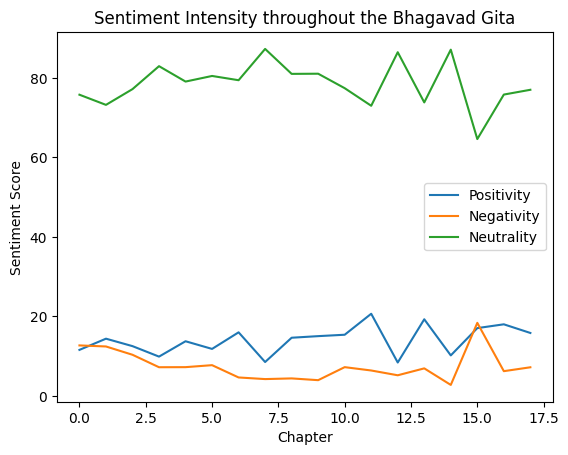

In [ ]:
#Making a Line PLot of Gita's Positivity, Negativity, and Neutrality Across All Chapters

plt.plot(GitaPositivity, label = "Positivity")
plt.plot(GitaNegativity, label = "Negativity")
plt.plot(GitaNeutrality, label = "Neutrality")
plt.legend()
plt.title("Sentiment Intensity throughout the Bhagavad Gita")
plt.xlabel("Chapter")
plt.ylabel("Sentiment Score")
plt.show()

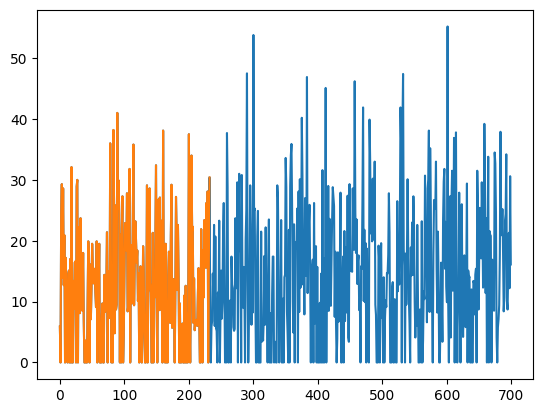

In [ ]:
plt.plot(df.Positive)
plt.plot(df.Positive[df.Chapter < 6])

Text(0.5, 1.0, 'Highlight of Negativity Drop in the Middle of the Gita')

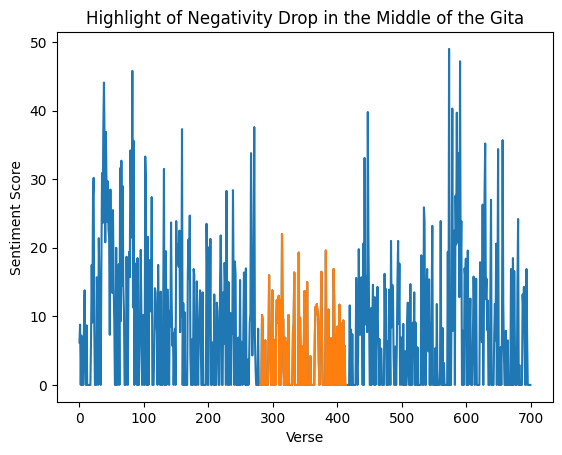

In [ ]:
plt.plot(df.Negative)
plt.plot(df.Negative[(df.Chapter > 6) & (df.Chapter < 11)])
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Highlight of Negativity Drop in the Middle of the Gita")

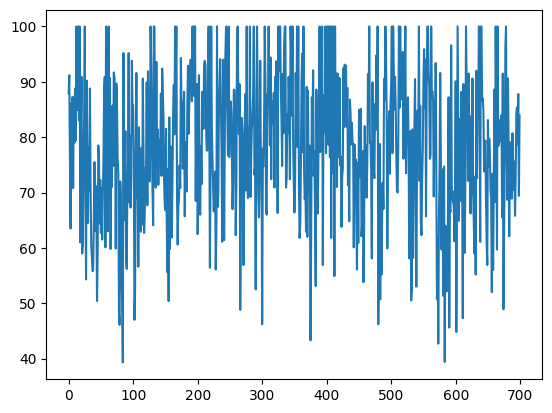

In [ ]:
plt.plot(df.Neutral)

Text(0.5, 1.0, "Overlay of Gita's Positivity (Blue) and Negativity (Orange) Distributions")

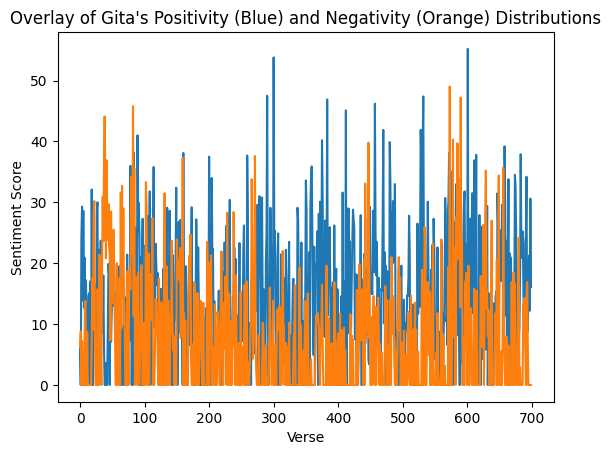

In [ ]:
plt.plot(df.Positive)
plt.plot(df.Negative)
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Overlay of Gita's Positivity (Blue) and Negativity (Orange) Distributions")

Text(0.5, 1.0, 'Distribution of Positivity Across All Gita Verses')

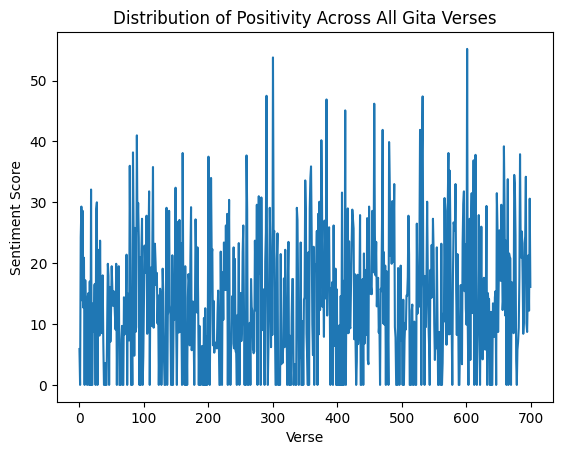

In [ ]:
plt.plot(df.Positive)
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Positivity Across All Gita Verses")

Text(0.5, 1.0, 'Distribution of Negativity Across All Gita Verses')

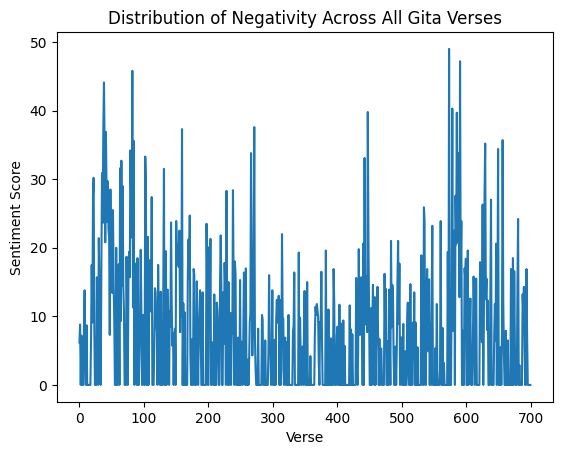

In [ ]:
plt.plot(df.Negative)
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Negativity Across All Gita Verses")

In [ ]:
# Most Positive Verses in the Gita
df[df.Positive > 50]

,Chapter,Verse,Text,Positive,Neutral,Negative
300,7,21,I will give unshakable faith to any devotee wh...,53.8,46.2,0.0
601,17,8,Foods that men of clarity prefer increase one'...,55.2,44.8,0.0


In [ ]:
# Most Negative Verses in the Gita
df[df.Negative > 45]

,Chapter,Verse,Text,Positive,Neutral,Negative
82,2,36,Your enemies will say many scandalous things a...,0.0,54.2,45.8
573,16,4,"But, Arjuna, the qualities of a man born into ...",8.3,42.7,49.0
590,16,21,This is the destruction of the self. This is t...,7.2,45.6,47.2


In [ ]:
# Most Neutral Verses in the Gita

df[df.Neutral > 99]

,Chapter,Verse,Text,Positive,Neutral,Negative
12,1,13,"Then conch shells and drums, and cymbals, and ...",0.0,100.0,0.0
15,1,16,"Yudhishthira the king, the son of Kunti, in tu...",0.0,100.0,0.0
17,1,18,and Drupada and the sons of Draupadi and the m...,0.0,100.0,0.0
25,1,26,Arjuna looked upon them there where they stood...,0.0,100.0,0.0
58,2,12,But in fact there never was a time when I did ...,0.0,100.0,0.0
...,...,...,...,...,...,...
639,18,18,The impulse to action is threefold: it involve...,0.0,100.0,0.0
640,18,19,The Sankhya doctrine of the three conditions o...,0.0,100.0,0.0
662,18,41,"Arjuna, Brahmins, and warriors, and villagers,...",0.0,100.0,0.0
665,18,44,"Farming, cattle-herding, and trade are the cas...",0.0,100.0,0.0


Text(0, 0.5, 'Positive Sentiment Percentage')

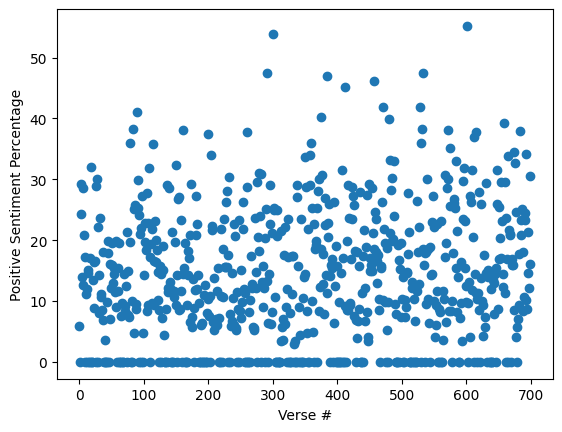

In [ ]:
plt.scatter(np.arange(df.shape[0]),df.loc[:,"Positive"])
plt.xlabel('Verse #')
plt.ylabel('Positive Sentiment Percentage')


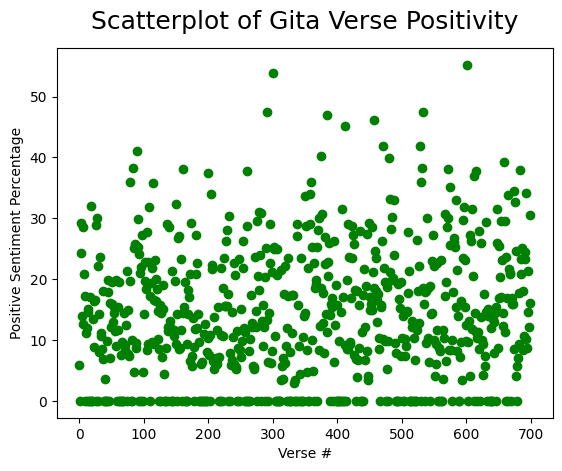

In [ ]:
plt.scatter(np.arange(df.shape[0]),df.loc[:,"Positive"], c='green')
plt.xlabel('Verse #')
plt.ylabel('Positive Sentiment Percentage')
plt.title("Scatterplot of Gita Verse Positivity", fontsize = 18, y = 1.03)

plt.show()

Text(0.5, 1.03, 'Scatterplot of Gita Verse Negativity')

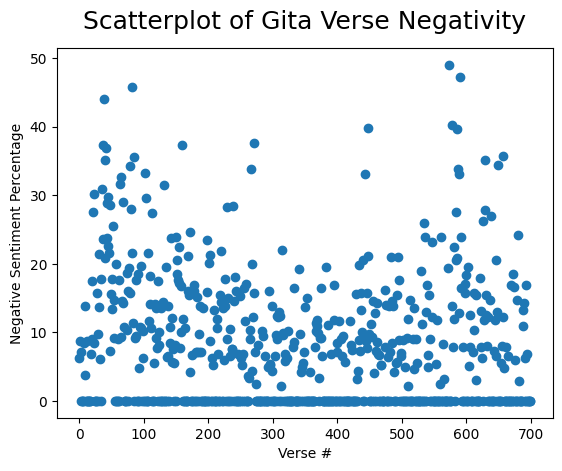

In [ ]:
plt.scatter(np.arange(df.shape[0]),df.loc[:,"Negative"])
plt.xlabel('Verse #')
plt.ylabel('Negative Sentiment Percentage')
plt.title("Scatterplot of Gita Verse Negativity", fontsize = 18, y = 1.03)

The below code attempts to do the same processes with the Qur'an.

In [ ]:
df2 = pd.read_csv ('/content/gdrive/MyDrive/Quran.csv')
print(df2)

      Surah  Ayah                                               Text
0         1     1  In the name of Allah, Most Gracious, Most Merc...
1         1     2  Praise be to Allah, the Cherisher and Sustaine...
2         1     3                      Most Gracious, Most Merciful;
3         1     4                     Master of the Day of Judgment.
4         1     5         Thee do we worship, and Thine aid we seek.
...     ...   ...                                                ...
6231    114     2                    The King (or Ruler) of Mankind,
6232    114     3                    The god (or judge) of Mankind,-
6233    114     4  From the mischief of the Whisperer (of Evil), ...
6234    114     5  (The same) who whispers into the hearts of Man...
6235    114     6                         Among Jinns and among men.

[6236 rows x 3 columns]


In [ ]:
df2['Positive'] = ''
df2['Neutral'] = ''
df2['Negative'] = ''

In [ ]:
# Create a SentimentIntensityAnalyzer object.
sentiment_analyzer = SentimentIntensityAnalyzer()

for index, row in df2.iterrows():
    text = row['Text']
    sentiment_dict = sentiment_analyzer.polarity_scores(text)

    df2.at[index,'Positive'] = sentiment_dict['pos']*100
    df2.at[index,'Neutral'] = sentiment_dict['neu']*100
    df2.at[index,'Negative'] = sentiment_dict['neg']*100

df2

,Surah,Ayah,Text,Positive,Neutral,Negative
0,1,1,"In the name of Allah, Most Gracious, Most Merc...",32.7,67.3,0.0
1,1,2,"Praise be to Allah, the Cherisher and Sustaine...",43.0,57.0,0.0
2,1,3,"Most Gracious, Most Merciful;",56.5,43.5,0.0
3,1,4,Master of the Day of Judgment.,0.0,100.0,0.0
4,1,5,"Thee do we worship, and Thine aid we seek.",21.6,78.4,0.0
...,...,...,...,...,...,...
6231,114,2,"The King (or Ruler) of Mankind,",0.0,100.0,0.0
6232,114,3,"The god (or judge) of Mankind,-",29.6,70.4,0.0
6233,114,4,"From the mischief of the Whisperer (of Evil), ...",0.0,61.5,38.5
6234,114,5,(The same) who whispers into the hearts of Man...,35.0,65.0,0.0


Text(0, 0.5, 'Positive Sentiment Percentage')

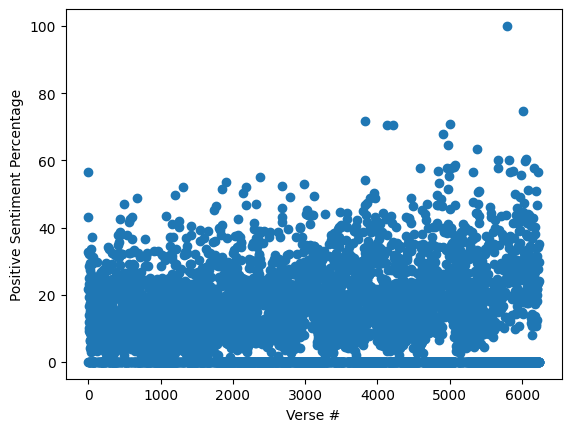

In [ ]:
plt.scatter(np.arange(df2.shape[0]),df2.loc[:,"Positive"])
plt.xlabel('Verse #')
plt.ylabel('Positive Sentiment Percentage')

Text(0, 0.5, 'Negative Sentiment Percentage')

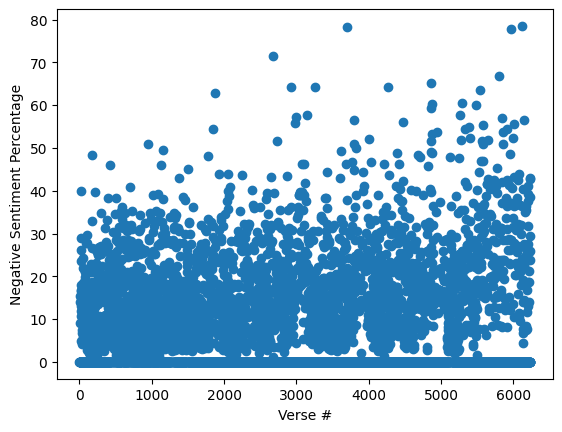

In [ ]:
plt.scatter(np.arange(df2.shape[0]),df2.loc[:,"Negative"])
plt.xlabel('Verse #')
plt.ylabel('Negative Sentiment Percentage')

In [ ]:
# descriptive statistics for the Qur'an

np.mean(df2.Positive), np.mean(df2.Negative), np.median(df2.Positive), np.median(df2.Negative), (np.max(df2.Positive) - np.min(df2.Positive)), (np.max(df2.Negative) - np.min(df2.Negative))

(11.615105837075001, 8.56300513149455, 9.65, 3.5999999999999996, 100.0, 78.5)

In [ ]:
# Most Positive Verses in the Qur'an

df2[df2.Positive > 65]

,Surah,Ayah,Text,Positive,Neutral,Negative
3829,37,42,Fruits (Delights); and they (shall enjoy) hono...,71.6,28.4,0.0
4133,40,1,Ha Mim,70.6,29.4,0.0
4218,41,1,Ha Mim:,70.6,29.4,0.0
4901,55,1,(Allah) Most Gracious!,67.7,32.3,0.0
5004,56,26,"Only the saying, ""Peace! Peace"".",70.9,29.1,0.0
5796,80,39,"Laughing, rejoicing.",100.0,0.0,0.0
6012,89,20,And ye love wealth with inordinate love!,74.8,25.2,0.0


In [ ]:
# Most Negative Verses in the Qur'an

df2[df2.Negative > 60]

,Surah,Ayah,Text,Positive,Neutral,Negative
1870,15,69,"""But fear Allah, and shame me not.""",0.0,37.2,62.8
2675,23,3,Who avoid vain talk;,0.0,28.6,71.4
2932,26,1,Ta. Sin. Mim.,0.0,35.7,64.3
3252,28,1,Ta. Sin. Mim.,0.0,35.7,64.3
3705,36,1,Ya Sin.,0.0,21.7,78.3
4273,42,2,'Ain. Sin. Qaf.,0.0,35.7,64.3
4861,54,16,But how (terrible) was My Penalty and My Warning?,0.0,34.8,65.2
4875,54,30,Ah! how (terrible) was My Penalty and My Warning!,0.0,39.8,60.2
5283,68,13,"Violent (and cruel),- with all that, base-born,-",0.0,39.4,60.6
5536,74,42,"""What led you into Hell Fire?""",0.0,36.4,63.6


In [ ]:
# Most Neutral Verses in the Qur'an

df2[df2.Neutral > 99]

,Surah,Ayah,Text,Positive,Neutral,Negative
3,1,4,Master of the Day of Judgment.,0.0,100.0,0.0
7,2,1,A. L. M.,0.0,100.0,0.0
14,2,8,"Of the people there are some who say: ""We beli...",0.0,100.0,0.0
37,2,31,And He taught Adam the names of all things; th...,0.0,100.0,0.0
74,2,68,"They said: ""Beseech on our behalf Thy Lord to ...",0.0,100.0,0.0
...,...,...,...,...,...,...
6222,112,2,"Allah, the Eternal, Absolute;",0.0,100.0,0.0
6223,112,3,"He begetteth not, nor is He begotten;",0.0,100.0,0.0
6225,113,1,Say: I seek refuge with the Lord of the Dawn,0.0,100.0,0.0
6231,114,2,"The King (or Ruler) of Mankind,",0.0,100.0,0.0


Text(0.5, 1.0, "Distribution of Positivity Across All Qur'an Verses")

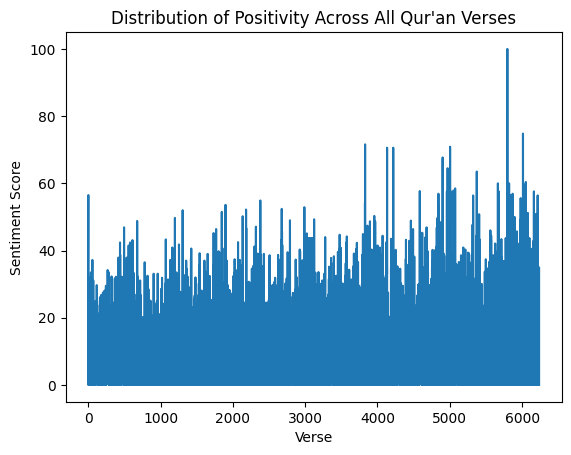

In [ ]:
plt.plot(df2.Positive)
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Positivity Across All Qur'an Verses")

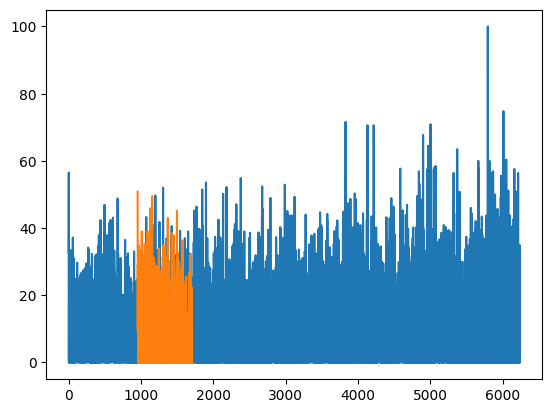

In [ ]:
plt.plot(df2.Positive)
plt.plot(df2.Negative[(df2.Surah > 6) & (df2.Surah < 13)])

Text(0.5, 1.0, "Distribution of Negativity Across All Qur'an Verses")

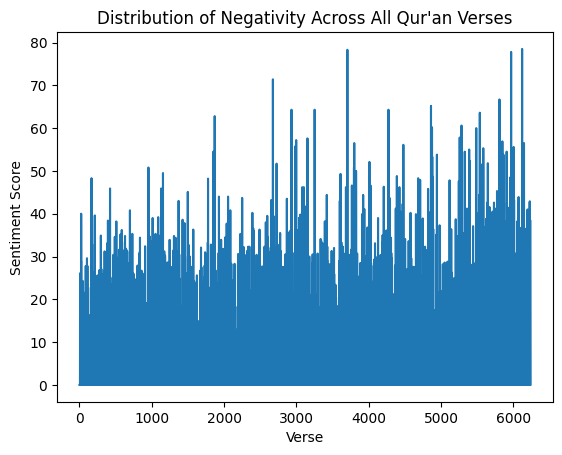

In [ ]:
plt.plot(df2.Negative)
plt.xlabel("Verse")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Negativity Across All Qur'an Verses")

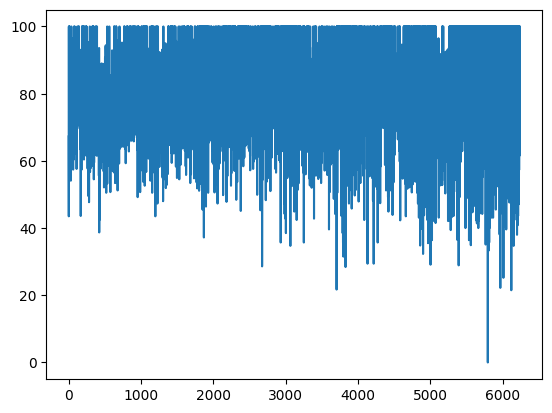

In [ ]:
plt.plot(df2.Neutral)

In [ ]:
# Gita1=df[df.Chapter=1]
# Gita1

# df.loc[:,"Chapter" == 1 ]

Quran1=df2[df2['Surah']==2]
Quran1

# Come back to iterate, try to nest everything in one data frame and then call indices for each chapter

num_chapters2 = df2['Surah'].max()
Quran = [''] * num_chapters2

for i in range(num_chapters2):
  Quran[i] = df2[df2['Surah']==i+1]

Quran[4]   # index is 1 less than the chapter number

,Surah,Ayah,Text,Positive,Neutral,Negative
669,5,1,O ye who believe! fulfil (all) obligations. La...,0.0,92.2,7.8
670,5,2,O ye who believe! Violate not the sanctity of ...,13.1,73.0,13.9
671,5,3,"Forbidden to you (for food) are: dead meat, bl...",9.0,75.7,15.2
672,5,4,They ask thee what is lawful to them (as food)...,6.1,87.7,6.3
673,5,5,This day are (all) things good and pure made l...,11.5,80.3,8.2
...,...,...,...,...,...,...
784,5,116,"And behold! Allah will say: ""O Jesus the son o...",12.1,85.4,2.5
785,5,117,"""Never said I to them aught except what Thou d...",3.9,96.1,0.0
786,5,118,"""If Thou dost punish them, they are Thy servan...",18.8,68.8,12.3
787,5,119,"Allah will say: ""This is a day on which the tr...",23.5,76.5,0.0


In [ ]:
#gives mean positivity of each Surah

QuranPositivity = []

for i in range(num_chapters2):
  Quran[i] = df2[df2['Surah']==i+1]
  QuranPositivity.append((np.mean(Quran[i].Positive)))
  print (QuranPositivity)


[28.25714285714286]
[28.25714285714286, 11.924825174825177]
[28.25714285714286, 11.924825174825177, 13.267999999999995]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995, 9.226666666666665]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995, 9.226666666666665, 9.466019417475726]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995, 9.226666666666665, 9.466019417475726, 11.473333333333333]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995, 9.226666666666665, 9.466019417475726, 11.473333333333333, 11.982945736434106]
[28.25714285714286, 11.924825174825177, 13.267999999999995, 13.44772727272727, 10.444999999999995, 9.226666666666

In [ ]:
for i in range(num_chapters2):
  Quran[i] = df2[df2['Surah']==i+1]
  print (np.mean(Quran[i].Neutral))

71.74285714285715
79.6241258741259
77.169
76.14431818181816
79.48333333333332
82.06060606060605
80.36844660194174
78.61600000000003
77.11860465116276
81.09633027522936
79.41219512195129
81.5072072072072
82.00697674418605
79.22884615384618
81.82929292929292
81.05156249999997
78.90360360360361
83.63909090909094
79.1755102040816
84.24962962962964
80.1857142857143
79.23333333333335
80.37203389830505
82.76562499999999
78.67402597402594
80.5290748898679
80.27849462365589
80.99772727272726
76.95942028985509
80.00666666666667
77.52941176470591
83.15333333333334
78.04657534246576
79.34444444444445
77.41555555555558
81.92168674698792
78.27967032967031
79.1522727272727
76.71333333333335
79.49882352941177
76.43333333333332
78.07924528301888
80.18539325842694
77.44237288135594
79.31621621621622
81.00571428571429
80.42631578947369
74.06896551724137
75.54444444444444
79.38444444444445
82.91333333333333
80.96734693877552
81.87258064516129
76.79818181818183
73.16538461538458
81.57083333333333
77.234482

In [ ]:
#gives mean negativity of each Surah

QuranNegativity = []

for i in range(num_chapters2):
  Quran[i] = df2[df2['Surah']==i+1]
  QuranNegativity.append(np.mean(Quran[i].Negative))
  print (QuranNegativity)

[0.0]
[0.0, 8.45174825174825]
[0.0, 8.45174825174825, 9.565000000000003]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.714545454545457]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.714545454545457, 10.166019417475729]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.714545454545457, 10.166019417475729, 9.904000000000002]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.714545454545457, 10.166019417475729, 9.904000000000002, 10.894573643410855]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.714545454545457, 10.166019417475729, 9.904000000000002, 10.894573643410855, 7.940366972477064]
[0.0, 8.45174825174825, 9.565000000000003, 10.40852272727273, 10.07333333333333, 8.71454

In [ ]:
#gives mean neutrality of each Surah

QuranNeutrality = []

for i in range(num_chapters2):
  Quran[i] = df2[df2['Surah']==i+1]
  QuranNeutrality.append(np.mean(Quran[i].Neutral))
  print (QuranNeutrality)


[71.74285714285715]
[71.74285714285715, 79.6241258741259]
[71.74285714285715, 79.6241258741259, 77.169]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332, 82.06060606060605]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332, 82.06060606060605, 80.36844660194174]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332, 82.06060606060605, 80.36844660194174, 78.61600000000003]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332, 82.06060606060605, 80.36844660194174, 78.61600000000003, 77.11860465116276]
[71.74285714285715, 79.6241258741259, 77.169, 76.14431818181816, 79.48333333333332, 82.06060606060605, 80.36844660194174, 78.61600000000003, 77.11860465116276, 81.09633027522936]
[71.74285714285715, 79.6241258741259, 77.1

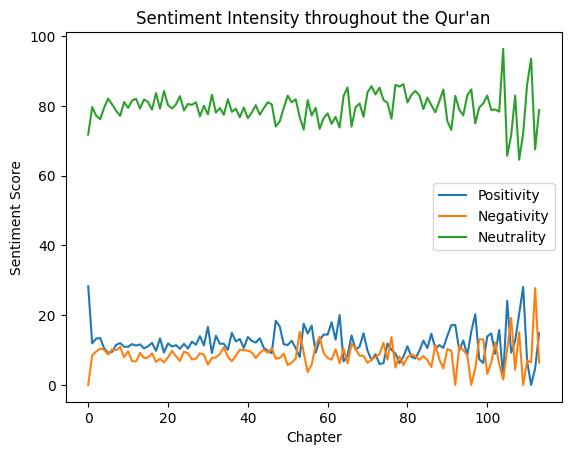

In [ ]:
#Making a Line PLot of Quran's Positivity, Negativity, and Neutrality Across All Chapters

plt.plot(QuranPositivity, label = "Positivity")
plt.plot(QuranNegativity, label = "Negativity")
plt.plot(QuranNeutrality, label = "Neutrality")
plt.xlabel("Chapter")
plt.ylabel("Sentiment Score")
plt.title("Sentiment Intensity throughout the Qur'an")
plt.legend()
plt.show()




The below code attempts to do the same thing with the Christian Bible.

In [ ]:
df3 = pd.read_csv ('/content/gdrive/MyDrive/ChristianBible.csv')
print(df3)

       book  chapter  verse                                               text
0         1        1      1  In the beginning God created the heaven and th...
1         1        1      2  And the earth was without form, and void; and ...
2         1        1      3  And God said, Let there be light: and there wa...
3         1        1      4  And God saw the light, that it was good: and G...
4         1        1      5  And God called the light Day, and the darkness...
...     ...      ...    ...                                                ...
31098    66       22     17  And the Spirit and the bride say, Come. And le...
31099    66       22     18  For I testify unto every man that heareth the ...
31100    66       22     19  And if any man shall take away from the words ...
31101    66       22     20  He which testifieth these things saith, Surely...
31102    66       22     21  The grace of our Lord Jesus Christ be with you...

[31103 rows x 4 columns]


In [ ]:
df3['Positive'] = ''
df3['Neutral'] = ''
df3['Negative'] = ''

In [ ]:
# Create a SentimentIntensityAnalyzer object.
sentiment_analyzer = SentimentIntensityAnalyzer()

for index, row in df3.iterrows():
    text = row['text']
    sentiment_dict = sentiment_analyzer.polarity_scores(text)

    df3.at[index,'Positive'] = sentiment_dict['pos']*100
    df3.at[index,'Neutral'] = sentiment_dict['neu']*100
    df3.at[index,'Negative'] = sentiment_dict['neg']*100

df3

,book,chapter,verse,text,Positive,Neutral,Negative
0,1,1,1,In the beginning God created the heaven and th...,51.4,48.6,0.0
1,1,1,2,"And the earth was without form, and void; and ...",11.9,81.8,6.3
2,1,1,3,"And God said, Let there be light: and there wa...",17.4,82.6,0.0
3,1,1,4,"And God saw the light, that it was good: and G...",32.1,58.8,9.0
4,1,1,5,"And God called the light Day, and the darkness...",8.7,83.0,8.3
...,...,...,...,...,...,...,...
31098,66,22,17,"And the Spirit and the bride say, Come. And le...",12.9,87.1,0.0
31099,66,22,18,For I testify unto every man that heareth the ...,5.5,94.5,0.0
31100,66,22,19,And if any man shall take away from the words ...,4.7,95.3,0.0
31101,66,22,20,"He which testifieth these things saith, Surely...",16.2,83.8,0.0


In [ ]:
# Splits Bible into a list of books

num_books = df3['book'].max()
Bible = [''] * num_books
for i in range(num_books):
  Bible[i] = df3[df3['book']==i+1]

# Bible
# df3[(df3['book']==1) & (df3['chapter']==2)]
first_book = Bible[0]
first_book_second_chapter = first_book[first_book['chapter']==2]
first_book_second_chapter

,book,chapter,verse,text,Positive,Neutral,Negative
31,1,2,1,"Thus the heavens and the earth were finished, ...",17.2,82.8,0.0
32,1,2,2,And on the seventh day God ended his work whic...,7.2,92.8,0.0
33,1,2,3,"And God blessed the seventh day, and sanctifie...",32.5,67.5,0.0
34,1,2,4,These are the generations of the heavens and o...,28.4,71.6,0.0
35,1,2,5,And every plant of the field before it was in ...,4.7,95.3,0.0
36,1,2,6,"But there went up a mist from the earth, and w...",0.0,100.0,0.0
37,1,2,7,And the LORD God formed man of the dust of the...,7.5,92.5,0.0
38,1,2,8,And the LORD God planted a garden eastward in ...,10.0,90.0,0.0
39,1,2,9,And out of the ground made the LORD God to gro...,20.9,70.9,8.2
40,1,2,10,And a river went out of Eden to water the gard...,0.0,100.0,0.0


In [ ]:

BiblePositivity = []

for i in range(num_books):
  BiblePositivity.append((np.mean(Bible[i].Positive)))
  print (BiblePositivity)

[6.065688193085456]
[6.065688193085456, 5.041467436108821]
[6.065688193085456, 5.041467436108821, 3.801513387660071]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076, 3.388601823708208]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076, 3.388601823708208, 4.909870550161811]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076, 3.388601823708208, 4.909870550161811, 4.258823529411765]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076, 3.388601823708208, 4.909870550161811, 4.258823529411765, 5.97617283950617]
[6.065688193085456, 5.041467436108821, 3.801513387660071, 2.706133540372673, 8.460479666319076, 3.388601823708208, 4.909870550161811, 4.2

In [ ]:
#gives mean negativity of each Surah

BibleNegativity = []

for i in range(num_books):
  BibleNegativity.append(np.mean(Bible[i].Negative))
  print (BibleNegativity)

[3.101956947162426]
[3.101956947162426, 3.181533388293487]
[3.101956947162426, 3.181533388293487, 4.639348079161816]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509, 2.2302431610942253]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509, 2.2302431610942253, 4.579935275080905]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509, 2.2302431610942253, 4.579935275080905, 2.2858823529411767]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509, 2.2302431610942253, 4.579935275080905, 2.2858823529411767, 4.792222222222223]
[3.101956947162426, 3.181533388293487, 4.639348079161816, 3.9052018633540384, 5.489051094890509, 2.2302431610942253, 4.57993

In [ ]:
BibleNeutrality = []

for i in range(num_books):
  BibleNeutrality.append(np.mean(Bible[i].Neutral))
  print (BibleNeutrality)

[90.83268101761259]
[90.83268101761259, 91.77642209398181]
[90.83268101761259, 91.77642209398181, 91.55948777648429]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645, 94.37948328267478]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645, 94.37948328267478, 90.51100323624601]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645, 94.37948328267478, 90.51100323624601, 93.45294117647059]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645, 94.37948328267478, 90.51100323624601, 93.45294117647059, 89.23160493827163]
[90.83268101761259, 91.77642209398181, 91.55948777648429, 93.38843167701869, 86.04963503649645, 94.37948328267478, 90.51100323624601, 93

In [ ]:

for i in BibleNegativity:
  print (i)

3.101956947162426
3.181533388293487
4.639348079161816
3.9052018633540384
5.489051094890509
2.2302431610942253
4.579935275080905
2.2858823529411767
4.792222222222223
4.913093525179859
3.7794117647058805
4.201947148817801
1.6969214437367304
3.5102189781021917
1.4421428571428567
2.2288177339901476
3.5976047904191626
8.483738317757005
7.821982933766777
11.70874316939891
10.778378378378372
2.088034188034188
7.456811145510838
7.283870967741944
11.585064935064933
4.7178318931657515
3.9299719887955193
8.89289340101523
7.59178082191781
7.501369863013697
7.647619047619047
8.781249999999998
7.567619047619045
10.582978723404256
10.85357142857143
9.78301886792453
2.139473684210526
5.0151658767772505
7.983636363636364
6.081419234360412
5.86740412979351
5.475238922675936
4.648919226393629
4.8621648460774605
8.089838337182451
6.180320366132721
5.7284046692607005
6.430201342281878
4.7058064516129035
4.720192307692308
4.405263157894738
6.296629213483146
5.687234042553191
6.386725663716814
6.334939759036

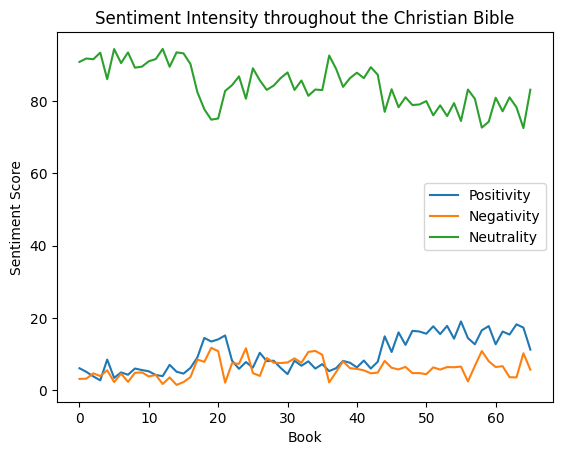

In [ ]:
#Making a Line PLot of Bible's Positivity, Negativity, and Neutrality Across All Chapters

plt.plot(BiblePositivity, label = "Positivity")
plt.plot(BibleNegativity, label = "Negativity")
plt.plot(BibleNeutrality, label = "Neutrality")
plt.xlabel("Book")
plt.ylabel("Sentiment Score")
plt.title("Sentiment Intensity throughout the Christian Bible")
plt.legend()
plt.show()

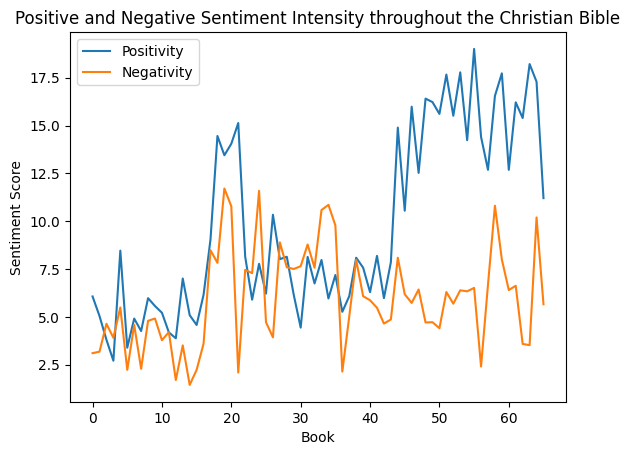

In [ ]:
#Making a Line PLot of Bible's Positivity, Negativity, and Neutrality Across All Chapters

plt.plot(BiblePositivity, label = "Positivity")
plt.plot(BibleNegativity, label = "Negativity")
plt.xlabel("Book")
plt.ylabel("Sentiment Score")
plt.title("Positive and Negative Sentiment Intensity throughout the Christian Bible")
plt.legend()
plt.show()

Text(0, 0.5, 'Positive Sentiment Percentage')

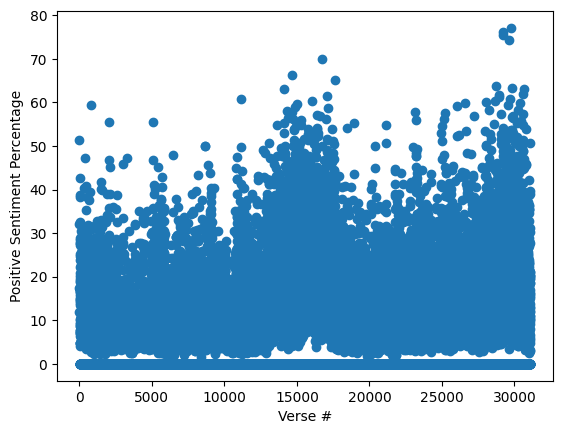

In [ ]:
plt.scatter(np.arange(df3.shape[0]),df3.loc[:,"Positive"])
plt.xlabel('Verse #')
plt.ylabel('Positive Sentiment Percentage')

Text(0, 0.5, 'Negative Sentiment Percentage')

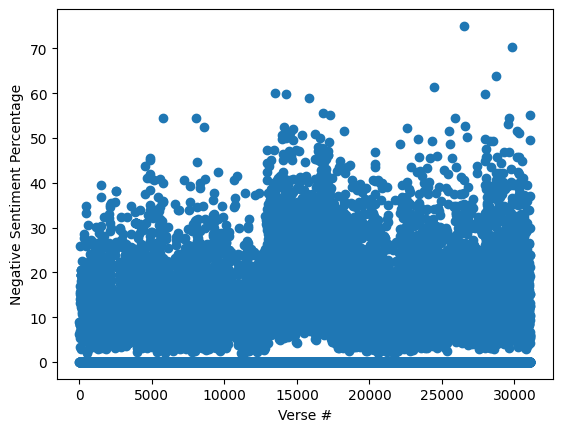

In [ ]:
plt.scatter(np.arange(df3.shape[0]),df3.loc[:,"Negative"])
plt.xlabel('Verse #')
plt.ylabel('Negative Sentiment Percentage')

In [ ]:
# descriptive statistics for the Christian Bible
np.mean(df3.Positive), np.mean(df3.Negative), np.median(df3.Positive), np.median(df3.Negative), (np.max(df3.Positive) - np.min(df3.Positive)), (np.max(df3.Negative) - np.min(df3.Negative))

(7.926148603028658, 5.524939716426057, 0.0, 0.0, 77.10000000000001, 75.0)

In [ ]:
# Most Positive Verses in the Bible

df3[df3.Positive > 70]

,book,chapter,verse,text,Positive,Neutral,Negative
29184,48,5,22,"But the fruit of the Spirit is love, joy, peac...",76.1,23.9,0.0
29233,49,2,4,"But God, who is rich in mercy, for his great l...",75.4,24.6,0.0
29637,52,5,16,Rejoice evermore.,74.4,25.6,0.0
29794,54,6,6,But godliness with contentment is great gain.,77.1,22.9,0.0


In [ ]:
# Most Negative Verses in the Bible

df3[df3.Negative > 57]

,book,chapter,verse,text,Positive,Neutral,Negative
13473,18,26,6,"Hell is naked before him, and destruction hath...",0.0,40.0,60.0
14270,19,25,19,Consider mine enemies; for they are many; and ...,0.0,40.2,59.8
15851,19,116,3,"The sorrows of death compassed me, and the pai...",0.0,41.2,58.8
24485,41,7,22,"Thefts, covetousness, wickedness, deceit, lasc...",11.1,27.6,61.3
26558,43,11,35,Jesus wept.,0.0,25.0,75.0
28007,45,3,16,Destruction and misery are in their ways:,0.0,40.3,59.7
28744,46,15,26,The last enemy that shall be destroyed is death.,0.0,36.1,63.9
29866,55,3,13,But evil men and seducers shall wax worse and ...,0.0,29.7,70.3


In [ ]:
# Most Neutral Verses in the Bible

df3[df3.Neutral > 99]

,book,chapter,verse,text,Positive,Neutral,Negative
12,1,1,13,And the evening and the morning were the third...,0.0,100.0,0.0
18,1,1,19,And the evening and the morning were the fourt...,0.0,100.0,0.0
22,1,1,23,And the evening and the morning were the fifth...,0.0,100.0,0.0
29,1,1,30,"And to every beast of the earth, and to every ...",0.0,100.0,0.0
36,1,2,6,"But there went up a mist from the earth, and w...",0.0,100.0,0.0
...,...,...,...,...,...,...,...
31074,66,21,20,"The fifth, sardonyx; the sixth, sardius; the s...",0.0,100.0,0.0
31075,66,21,21,And the twelve gates were twelve pearls: every...,0.0,100.0,0.0
31083,66,22,2,"In the midst of the street of it, and on eithe...",0.0,100.0,0.0
31085,66,22,4,And they shall see his face; and his name shal...,0.0,100.0,0.0


Text(0.5, 1.0, 'Distribution of Positivity Across All Bible Verses')

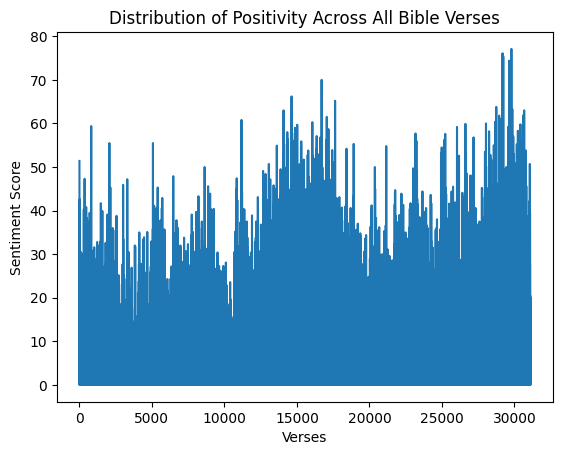

In [ ]:
plt.plot(df3.Positive)
plt.xlabel("Verses")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Positivity Across All Bible Verses")

Text(0.5, 1.0, 'Distribution of Negativity Across All Bible Verses')

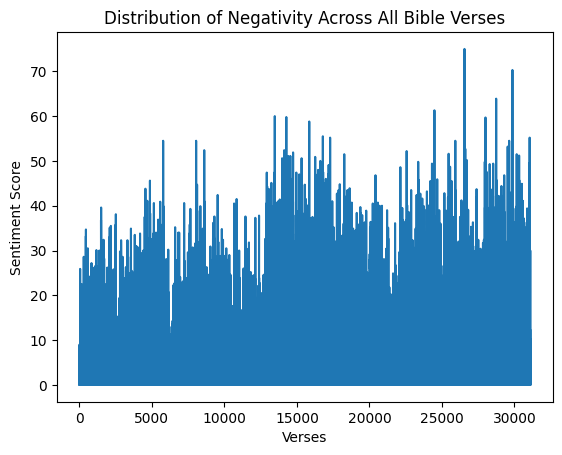

In [ ]:
plt.plot(df3.Negative)
plt.xlabel("Verses")
plt.ylabel("Sentiment Score")
plt.title("Distribution of Negativity Across All Bible Verses")

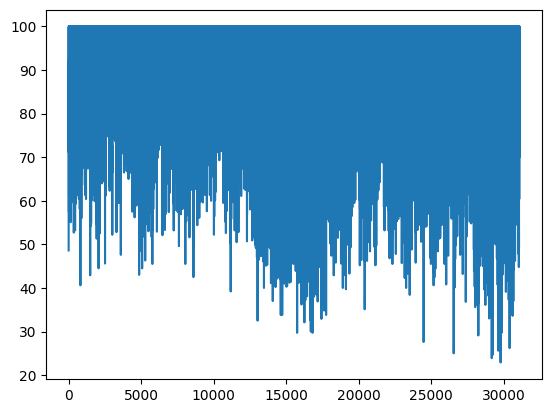

In [ ]:
plt.plot(df3.Neutral)

NEXT SECTION: WORD CLOUDS

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from google.colab import files
from scipy import stats
import random
import copy


import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

import requests
from bs4 import BeautifulSoup

!pip install wordcloud
from wordcloud import WordCloud

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


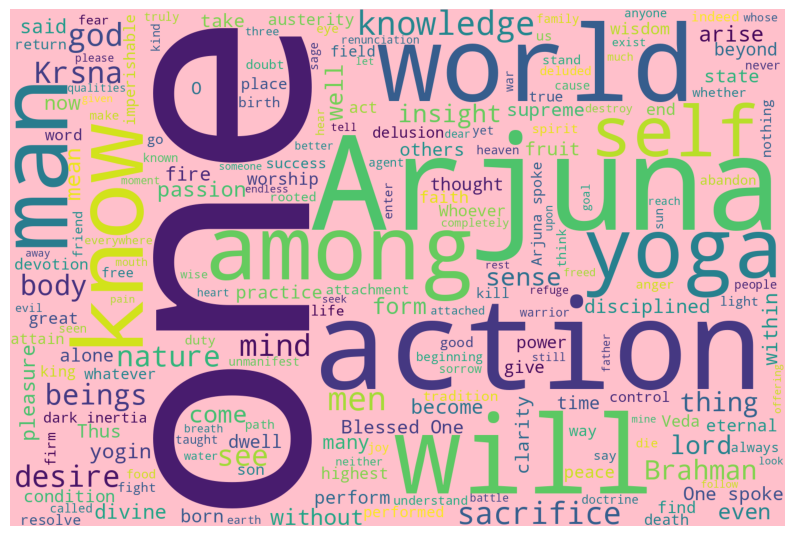

In [ ]:
dev = df.Text
# set([t.parent.name for t in t])

output = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in dev:
        output += '{} '.format(line)

def plot_cloud(wordcloud):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud)
    plt.axis("off");
wordcloud = WordCloud(width = 1500, height = 1000, background_color='pink').generate(output)
plot_cloud(wordcloud)


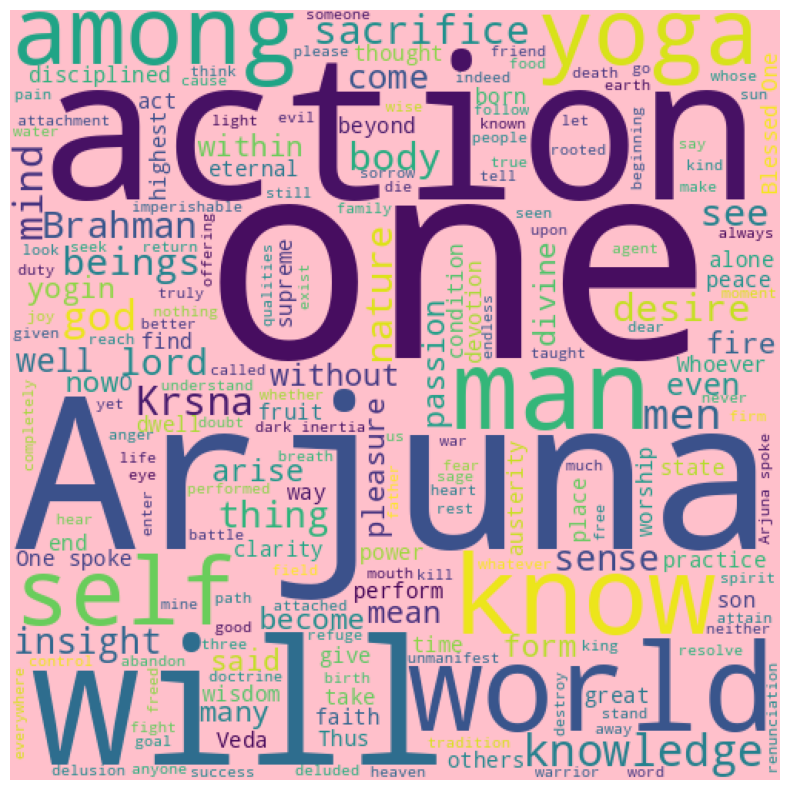

In [ ]:
dfstr = str(df.Text)
dfwc = wordcloud.generate(dfstr)

def plot_cloud2(dfwc):
    plt.figure(figsize=(10, 10))
    plt.imshow(dfwc)
    plt.axis("off");
wordcloud2 = WordCloud(width = 500, height = 500, background_color='pink', random_state=10).generate(output)
plot_cloud(wordcloud2)

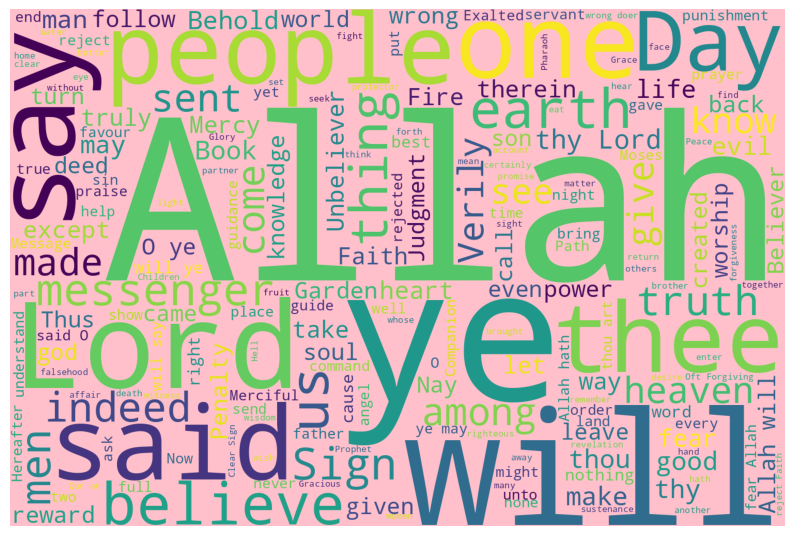

In [ ]:
devq = df2.Text
# set([t.parent.name for t in t])

output2 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in devq:
        output2 += '{} '.format(line)

def plot_cloud(wordcloud2):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud2)
    plt.axis("off");
wordcloud2 = WordCloud(width = 1500, height = 1000, background_color='pink').generate(output2)
plot_cloud(wordcloud2)


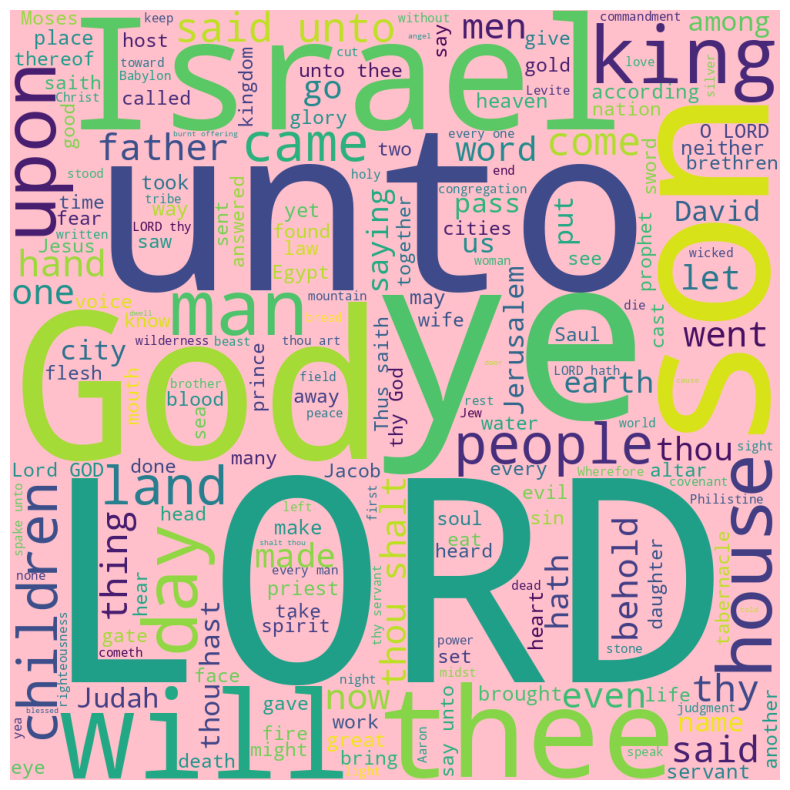

In [ ]:
devb = df3.text
# set([t.parent.name for t in t])

output3 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in devb:
        output3 += '{} '.format(line)

def plot_cloud(wordcloud3):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud3)
    plt.axis("off");
wordcloud3 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output3)
plot_cloud(wordcloud3)

Positive : ['magnificent', 'great', 'best', 'strength', 'delighted', 'great', 'dear', 'friends,', 'compassion,', 'hand,', 'desire', 'desired', 'joy', 'wisdom', 'great', 'engage', 'like', 'wealth', 'Blessed', 'wise', 'certain', 'wonderful', 'opportunity', 'chance,', 'great', 'win', 'heaven.', 'Joy', 'success', 'Progress', 'resolve', 'please', 'desire', 'pleasure', 'natural', 'useful', 'committed', 'committed', 'Blessed', 'desire', 'fascination', 'intelligent', 'peace,', 'great', 'divine', 'Creation,', 'Good', 'pleasure', 'best', 'engage', '143', 'truly', 'Attraction', 'better', 'commit', 'Blessed', 'desire,', 'well,', 'superior', 'Gain', 'Blessed', 'Blessed', 'truly', 'hope', 'success', 'created', 'free', 'Giving', 'attachment', 'hope,', 'chance', 'free', 'engage', 'engage', 'faith,', 'praise', 'Blessed', 'desire', 'relieves', 'true', 'created', 'pleasure', 'delights', 'pleasure', 'joy', 'peace', 'enjoyer', 'Blessed', 'advanced', 'friend', 'peaceful', 'delights', 'steadfast,', 'peace', 

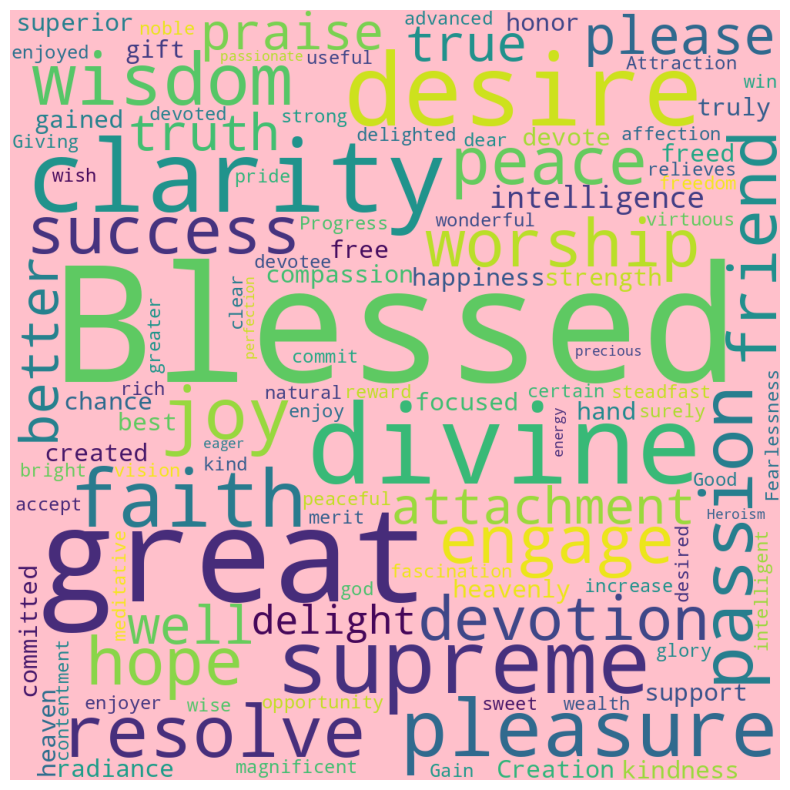

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordGita = df.Text
wordGita = wordGita.to_string()

for word in wordGita.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

print('Positive :',pos_word_list)
print('Neutral :',neu_word_list)
print('Negative :',neg_word_list)

gposdf = pd.DataFrame (pos_word_list, columns = ['words'])
print (gposdf)
gposdf.value_counts()

output4 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in gposdf.words:
        output4 += '{} '.format(line)

def plot_cloud(wordcloud4):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud4)
    plt.axis("off");
wordcloud4 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output4)
plot_cloud(wordcloud4)

        words
0         war
1          no
2        kill
3        kill
4        kill
..        ...
153    poison
154        no
155  egotism,
156   egotism
157        No

[158 rows x 1 columns]


words      
no             21
fire            5
death           4
No              4
cut             4
               ..
dislike         1
disgrace,       1
discards        1
destruction     1
worries,        1
Length: 108, dtype: int64

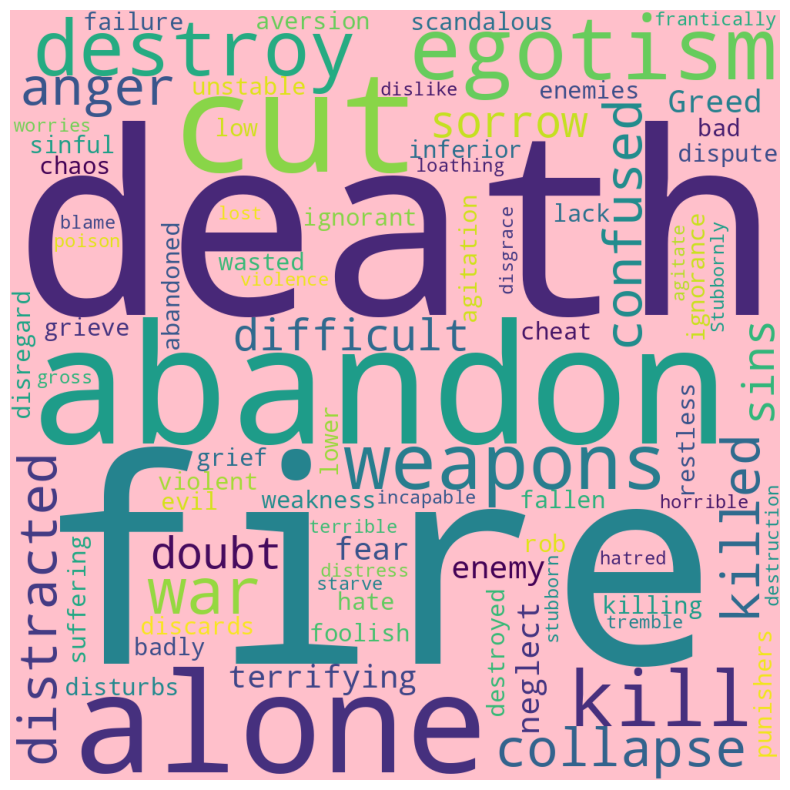

In [ ]:
nposdf = pd.DataFrame (neg_word_list, columns = ['words'])
print (nposdf)
nposdf.value_counts()

output5 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in nposdf.words:
        output5 += '{} '.format(line)

def plot_cloud(wordcloud5):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud5)
    plt.axis("off");
wordcloud5 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output5)
plot_cloud(wordcloud5)

nposdf.value_counts()

Positive : ['Gracious,', 'Praise', 'Cherisher', 'Gracious,', 'worship,', 'sure,', 'steadfast', 'Faith,', 'surety,', 'Adore', 'surety', 'glad', 'faith', 'created', '"Glory', 'Faith', 'Truth', 'steadfast', 'help', 'certainty', 'forgive', 'well', 'entertain', 'hope', 'Faith,', 'gain', 'faith', 'clear', 'Faith', 'Faith!', 'wish', 'Faith', 'wish', 'steadfast', 'Paradise', 'Glory', 'truth', '143', 'Truth', 'help', 'sure', 'blessings', 'clear', 'Faith,', 'god', 'creation', 'heavens', 'clear', 'Faith', 'good', 'well', 'accomplished', 'Celebrate', 'praises', 'clear', 'clear', 'pray', 'clear', 'vision', 'beautiful', 'vision', 'advanced', 'god', 'Truth', 'vision', 'Kind', 'charity', 'wish', 'good', 'wisdom', 'charity', 'devotion,', 'charity,', 'blessing,', 'grant', 'heavens', 'greater', 'god', 'Faith', 'better', 'Faith:', 'Fair', 'love', 'glad', 'god', 'vision', 'gain', 'friends', 'love', 'graciously', 'accept', 'pray', 'worship', 'faith,', 'Truth', 'true', 'god', 'wish', 'Truth', 'Mercy', 'faith

words   
created     96
heavens     78
like        43
good        41
favours     37
            ..
clean:       1
clean        1
cherish      1
charity;     1
expand       1
Length: 447, dtype: int64

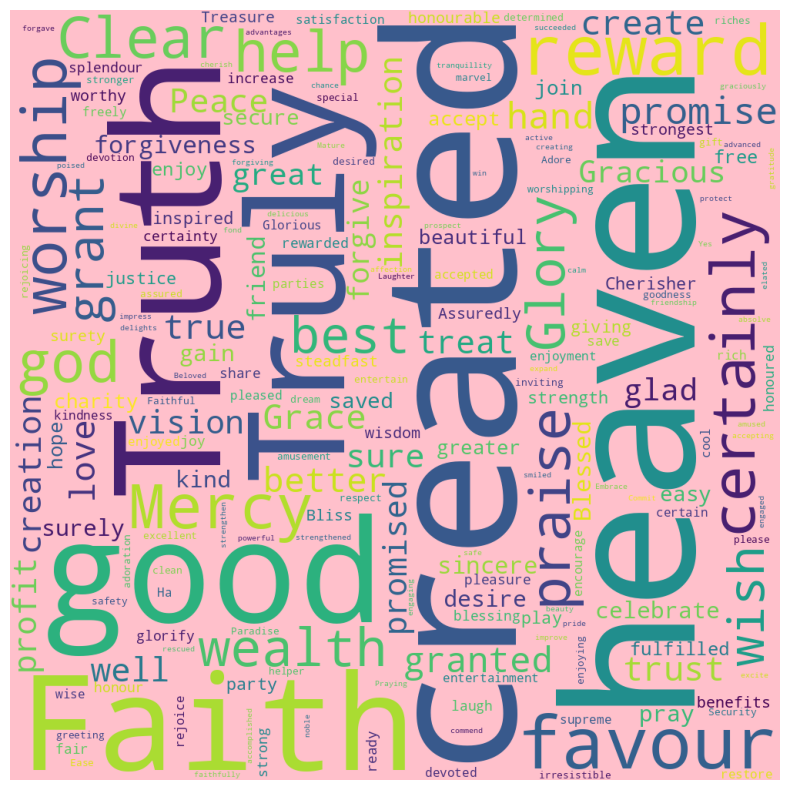

In [ ]:
sid = SentimentIntensityAnalyzer()
pos_word_listq=[]
neu_word_listq=[]
neg_word_listq=[]

wordQuran = df2.Text
wordQuran = wordQuran.to_string()

for word in wordQuran.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_listq.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_listq.append(word)
    else:
        neu_word_listq.append(word)

print('Positive :',pos_word_listq)
print('Neutral :',neu_word_listq)
print('Negative :',neg_word_listq)

qposdf = pd.DataFrame (pos_word_listq, columns = ['words'])
print (qposdf)
qposdf.value_counts()

output6 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in qposdf.words:
        output6 += '{} '.format(line)

def plot_cloud(wordcloud6):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud6)
    plt.axis("off");
wordcloud6 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output6)
plot_cloud(wordcloud6)

qposdf.value_counts()

         words
0       reject
1      deceive
2     mischief
3      mockery
4        dumb,
...        ...
1333  Darkness
1334  mischief
1335  mischief
1336   envious
1337  mischief

[1338 rows x 1 columns]


words    
no           167
reject        72
fear          56
rejected      37
evil          33
            ... 
"Dispute       1
Forbidden      1
enemy:         1
envied         1
Fighting       1
Length: 395, dtype: int64

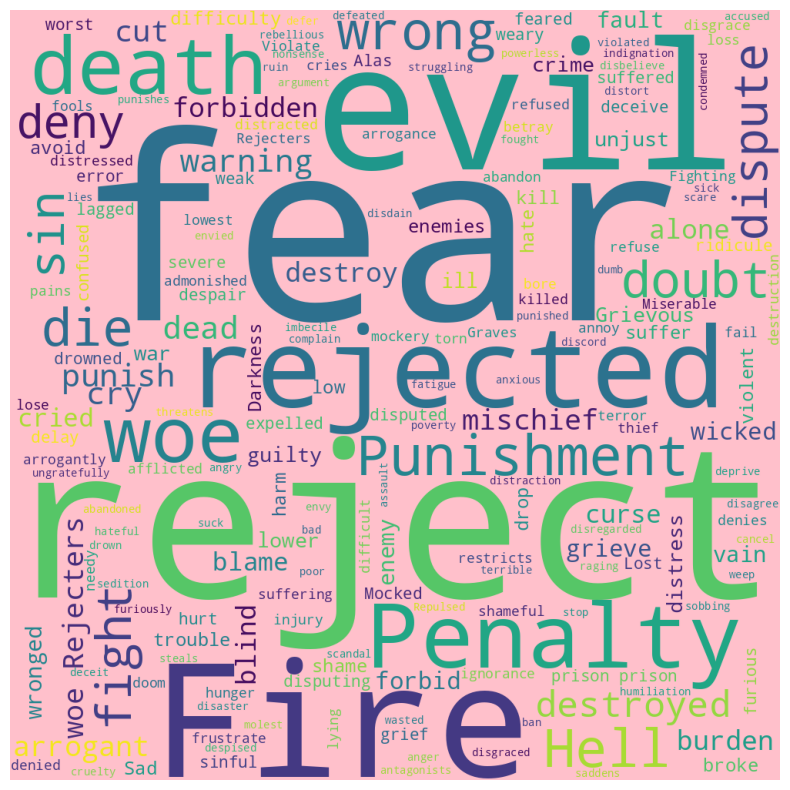

In [ ]:
qnegdf = pd.DataFrame (neg_word_listq, columns = ['words'])
print (qnegdf)
qnegdf.value_counts()

output7 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in qnegdf.words:
        output7 += '{} '.format(line)

def plot_cloud(wordcloud7):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud7)
    plt.axis("off");
wordcloud7 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output7)
plot_cloud(wordcloud7)

qnegdf.value_counts()

Positive : ['God', 'created', 'heaven', 'God', 'God', 'good:', 'God', 'God', 'God', 'God', 'Heaven.', 'God', 'heaven', 'God', 'God', 'God', 'God', 'great', 'greater', 'God', 'God', 'God', 'created', 'great', 'God', 'blessed', 'God', 'God', 'God', 'God', 'created', 'God', 'blessed', 'God', 'God', 'God', 'heavens', 'God', 'God', 'blessed', 'heavens', 'God', 'God', 'God', 'good:', 'God', 'God', 'good', 'God', 'good', 'God', 'God', 'God', 'God', 'good', 'God', 'God', 'God', 'God', 'God', 'God', 'well,', 'truly', 'created', 'blessed', 'God', 'God:', 'God', 'God', '143', 'grace', 'God,', 'God', 'God', 'kind,', 'God', 'clean', 'clean', 'kind,', 'increased', 'God', 'God', 'sweet', 'God', 'blessed', 'surely', 'God', 'God', 'God', 'Blessed', 'God', 'God', 'great', 'bless', 'bless', 'pray', 'well', 'rich', 'blessed', 'Blessed', 'blessed', 'God,', 'Save', 'God,', 'God,', 'surety', 'peace;', 'hand', 'well', 'God', 'God', 'God', 'bless', 'laughed,', 'God,', 'God', 'God', 'favor', 'pray', 'certainly'

words     
God           861
God,          318
like          216
great         214
hand          187
             ... 
glorifying      1
glorified,      1
gladly,         1
gift;           1
youthful        1
Length: 779, dtype: int64

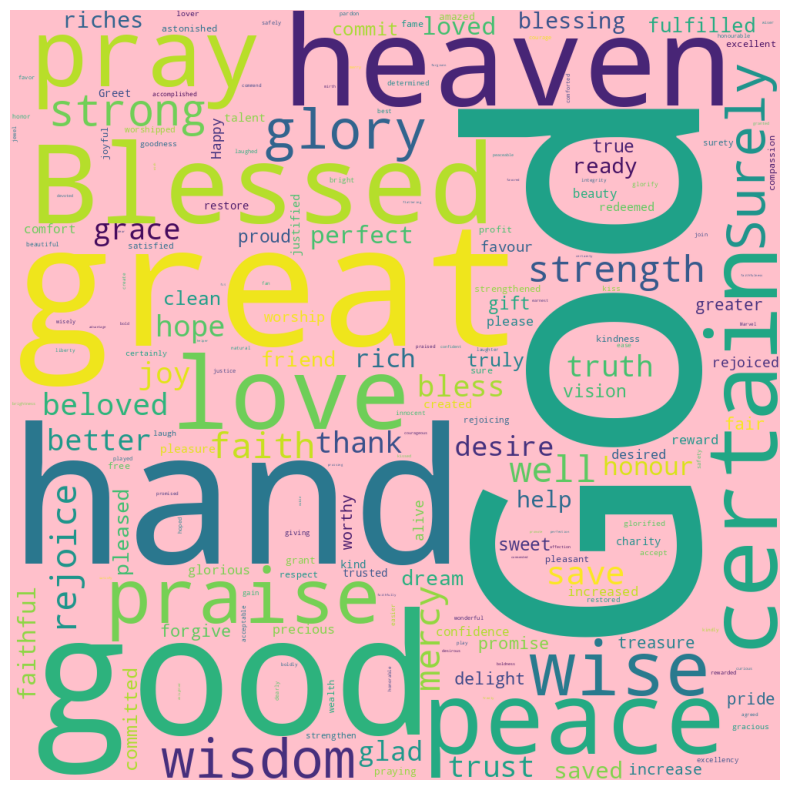

In [ ]:
sid = SentimentIntensityAnalyzer()
pos_word_listb=[]
neu_word_listb=[]
neg_word_listb=[]

wordBible = df3.text
wordBible = wordBible.to_string()

for word in wordBible.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_listb.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_listb.append(word)
    else:
        neu_word_listb.append(word)

print('Positive :',pos_word_listb)
print('Neutral :',neu_word_listb)
print('Negative :',neg_word_listb)

bposdf = pd.DataFrame (pos_word_listb, columns = ['words'])
print (bposdf)
bposdf.value_counts()

output8 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bposdf.words:
        output8 += '{} '.format(line)

def plot_cloud(wordcloud8):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud8)
    plt.axis("off");
wordcloud8 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output8)
plot_cloud(wordcloud8)

bposdf.value_counts()

           words
0             86
1     punishment
2     wickedness
3        destroy
4           died
...          ...
4504          no
4505      curse:
4506          no
4507     unjust,
4508      unjust

[4509 rows x 1 columns]


words       
no              375
evil            147
wicked          106
fear             97
sin              95
               ... 
forbid.           1
foolishness;      1
foolishly         1
foolish?          1
guilt             1
Length: 836, dtype: int64

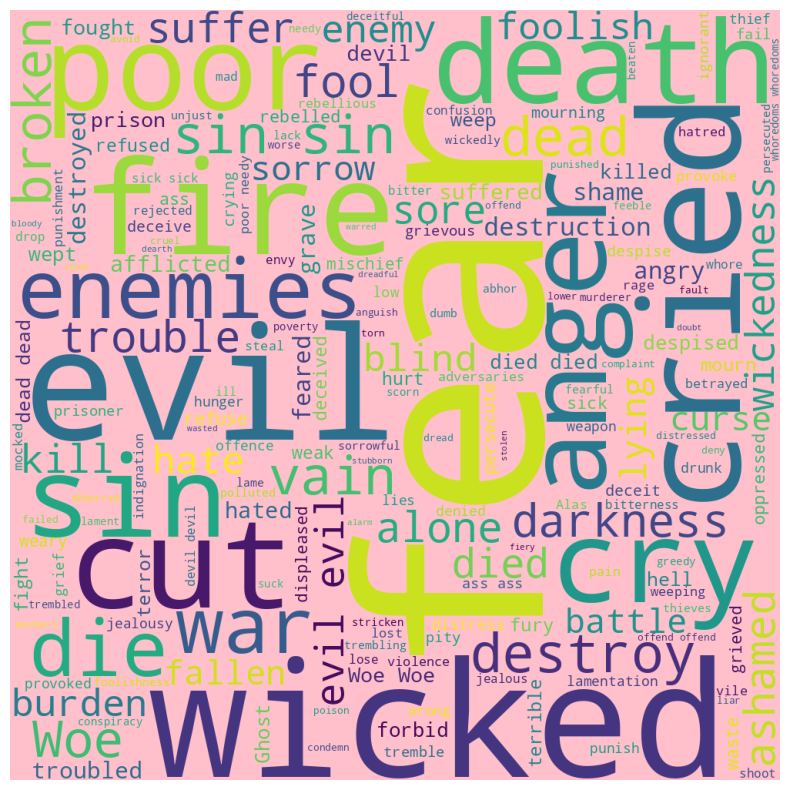

In [ ]:
bnegdf = pd.DataFrame (neg_word_listb, columns = ['words'])
print (bnegdf)
bnegdf.value_counts()

output9 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bnegdf.words:
        output9 += '{} '.format(line)

def plot_cloud(wordcloud9):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud9)
    plt.axis("off");
wordcloud9 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output9)
plot_cloud(wordcloud9)

bnegdf.value_counts()

              words
0                 0
1     Dhritarashtra
2            spoke:
3                On
4               the
...             ...
6586             of
6587          yoga,
6588            is,
6589            and
6590        wher...

[6591 rows x 1 columns]


words    
the          303
of           176
is           155
and          150
I            120
            ... 
99             1
98             1
97             1
96             1
yourself,      1
Length: 2308, dtype: int64

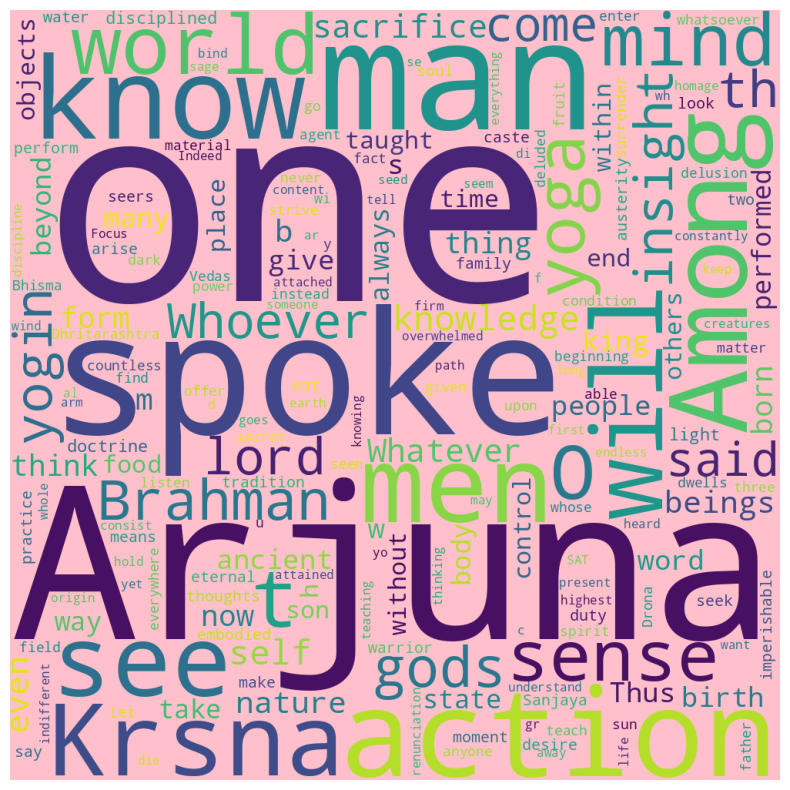

In [ ]:
#Word Cloud of Neutral Words, Gita

neuposdf = pd.DataFrame (neu_word_list, columns = ['words'])
print (neuposdf)
neuposdf.value_counts()

output10 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in neuposdf.words:
        output10 += '{} '.format(line)

def plot_cloud(wordcloud10):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud10)
    plt.axis("off");
wordcloud10 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output10)
plot_cloud(wordcloud10)

neuposdf.value_counts()

       words
0          0
1         In
2        the
3       name
4         of
...      ...
60430  Among
60431  Jinns
60432    and
60433  among
60434   men.

[60435 rows x 1 columns]


words   
the         2572
of          1360
to          1217
and         1081
...          978
            ... 
4414           1
4415           1
4416           1
4417           1
zodiacal       1
Length: 13804, dtype: int64

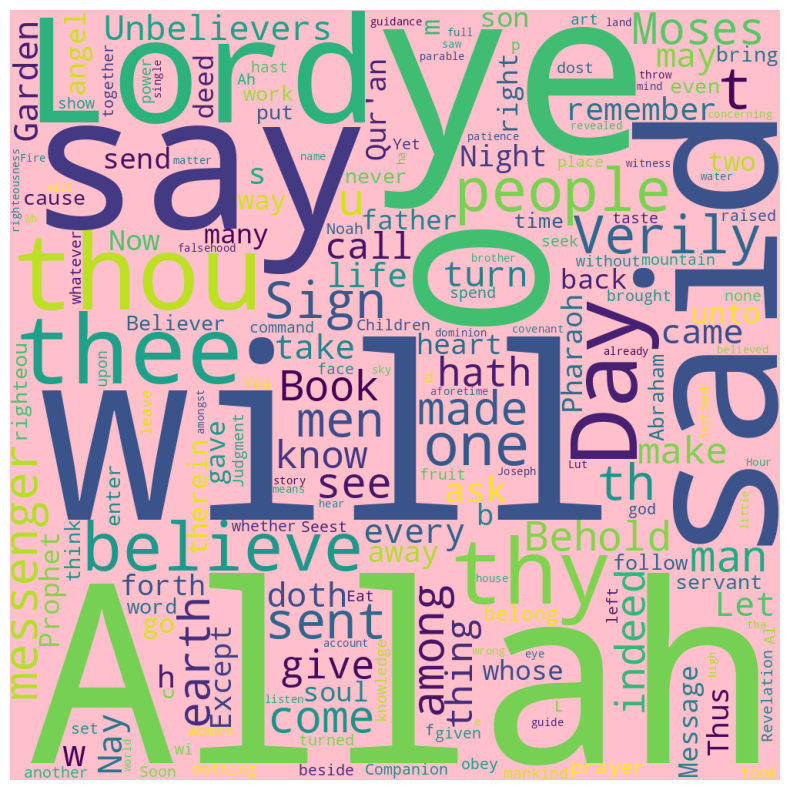

In [ ]:
qneudf = pd.DataFrame (neu_word_listq, columns = ['words'])
print (qneudf)
qneudf.value_counts()

output11 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in qneudf.words:
        output11 += '{} '.format(line)

def plot_cloud(wordcloud11):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud11)
    plt.axis("off");
wordcloud11 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output11)
plot_cloud(wordcloud11)

qneudf.value_counts()

            words
0               0
1              In
2             the
3       beginning
4             the
...           ...
316708      Jesus
316709     Christ
316710         be
316711       with
316712     you...

[316713 rows x 1 columns]


words
the      20394
And      11646
of        9826
and       9289
...       5821
         ...  
24623        1
24624        1
24625        1
24626        1
3946         1
Length: 48840, dtype: int64

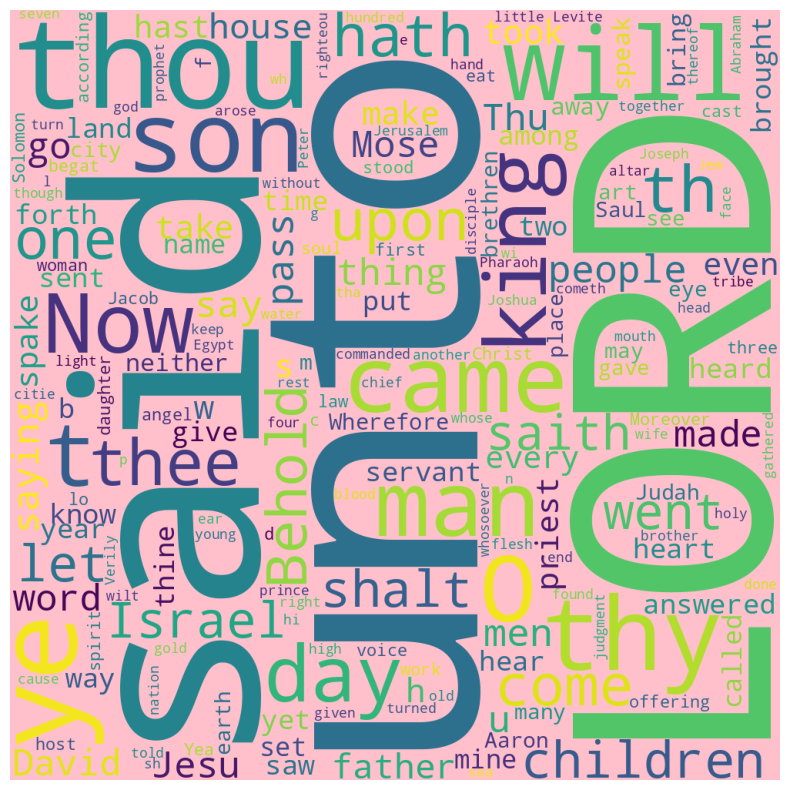

In [ ]:
bneudf = pd.DataFrame (neu_word_listb, columns = ['words'])
print (bneudf)
bneudf.value_counts()

output12 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bneudf.words:
        output12 += '{} '.format(line)

def plot_cloud(wordcloud12):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud12)
    plt.axis("off");
wordcloud12 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output12)
plot_cloud(wordcloud12)

bneudf.value_counts()

           words
0       Positive
1    compassion,
2           gain
3        heaven.
4         honor.
..           ...
124       peace.
125         free
126       peace.
127       divine
128        peace

[129 rows x 1 columns]
['Positive', 'compassion,', 'gain', 'heaven.', 'honor.', 'engage', 'devotion', 'great', 'better', 'like', 'win', 'win.', 'wish', 'like', 'better?', 'clearly.', 'wealth', 'prosperous', 'smile,', 'Blessed', 'like', 'wisdom,', 'truly', 'wise', 'pleasure', 'wise', 'pleasure', 'fit', 'certain', 'certain', 'wonderful', 'wonderful', 'wonderful', 'noble', 'opportunity', 'chance,', 'heaven', 'happy', 'opportunity', 'honor', 'well,', 'won', 'great', 'win', 'heaven.', 'enjoy.', 'Joy', 'success', 'treat', 'Progress', 'great', 'resolve', 'resolve', 'please', 'desire', 'eager', 'heaven.', 'promise', 'gain', 'pleasure', 'pleasure', 'good', 'resolve,', 'gain', 'engaged', 'natural', 'free', 'true', 'free', 'wealth', 'enjoyment', 'useful', 'useful', 'true', 'Treat', 'success', 'k

words       
'like',         5
'wisdom',       5
'desire',       5
'peace.',       4
'pleasure',     4
               ..
'honor',        1
'honor.',       1
'Freed',        1
'kind',         1
['Positive',    1
Length: 77, dtype: int64

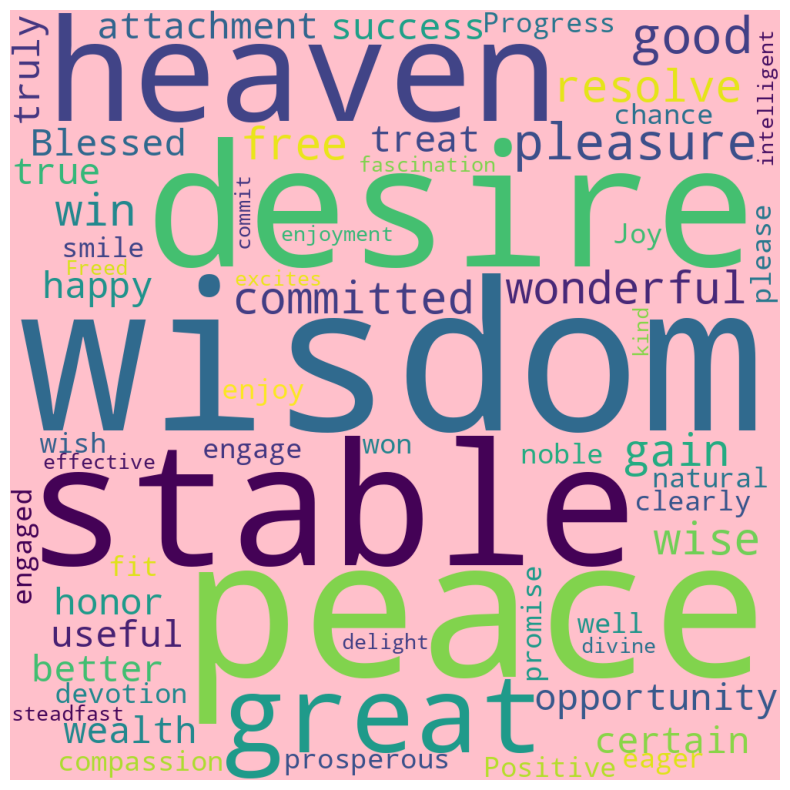

In [ ]:
#takes any chapter of the Gita and outputs an positive word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordGita = Gita[1]
wordGita = wordGita.to_string()

for word in wordGita.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

gposdf = pd.DataFrame (pos_word_list, columns = ['words'])
print (gposdf)
gposdf.value_counts()

output13 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in gposdf.words:
        output13 += '{} '.format(line)

def plot_cloud(wordcloud13):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud13)
    plt.axis("off");
wordcloud13 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output13)
plot_cloud(wordcloud13)

print(pos_word_list)

t = str(pos_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()


['Negative', 'abandonment', 'abandonment', 'abandoned', 'abandoned.', 'abandonment,', 'Abandonment', 'abandoned.', 'abandon', 'abandon', 'abandon', 'confusion', 'darkness', 'abandon', 'pain', 'fear', 'harm', 'abandonment', 'abandons', 'abandonment', 'abandons', 'dislike', 'unpleasant', 'severed', 'doubt.', 'abandons', 'death,', 'abandoned', 'undesirable,', 'alone', 'Confused', 'no', 'egotism,', 'kill,', 'kill', 'insignificant', 'no', 'hatred', 'egotism,', 'destruction', 'violence', 'greedy', 'violent', 'arrogant,', 'dishonest,', 'lazy,', 'depressed,', 'fear', 'darkness', 'worries', 'fool', 'fear', 'pain', 'depression', 'darkness', 'suffering.', 'poison', 'no', 'battle,', 'guilt.', 'harm', 'fire.', 'abandons', 'hatred.', 'egotism,', 'anger,', 'grieve,', 'difficulty.', 'egotism,', 'egotism', 'useless.', 'evil.', 'worry!', 'dispute', 'fail,', 'No', 'disputing', 'alone?', 'ignorance', 'doubts']


words           
'egotism,',         4
'abandonment',      4
'abandon',          4
'abandons',         4
'darkness',         3
'no',               3
'fear',             3
'abandoned.',       2
'abandoned',        2
'harm',             2
'pain',             2
'grieve,',          1
'guilt.',           1
'kill,',            1
'hatred',           1
'hatred.',          1
'ignorance',        1
'insignificant',    1
'kill',             1
'Abandonment',      1
'severed',          1
'lazy,',            1
'poison',           1
'fool',             1
'suffering.',       1
'undesirable,',     1
'unpleasant',       1
'useless.',         1
'violence',         1
'violent',          1
'worries',          1
'worry!',           1
'greedy',           1
'evil.',            1
'fire.',            1
'fail,',            1
'No',               1
'abandonment,',     1
'alone',            1
'alone?',           1
'anger,',           1
'arrogant,',        1
'battle,',          1
'confusion',        1
'death,',      

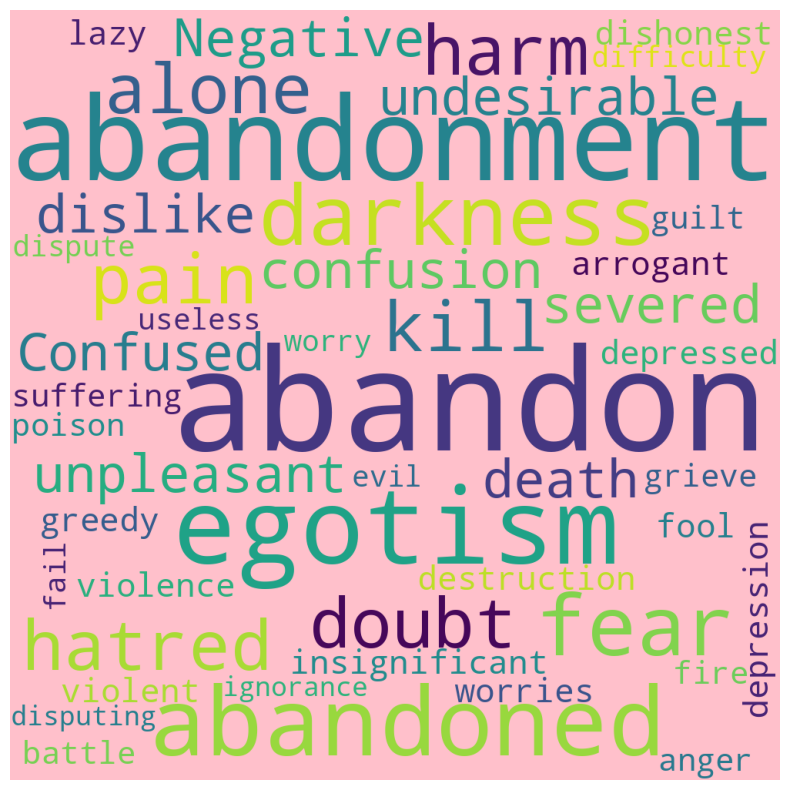

In [ ]:
#takes any chapter of the Gita and outputs a negative word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordGita = Gita[17]
wordGita = wordGita.to_string()

for word in wordGita.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

gnegdf = pd.DataFrame (neg_word_list, columns = ['words'])

output14 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in gnegdf.words:
        output14 += '{} '.format(line)

def plot_cloud(wordcloud14):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud14)
    plt.axis("off");
wordcloud14 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output14)
plot_cloud(wordcloud14)

print(neg_word_list)

t = str(neg_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()



['Positive', 'Cherisher', 'god']


words       
'Cherisher',    1
'god']          1
['Positive',    1
dtype: int64

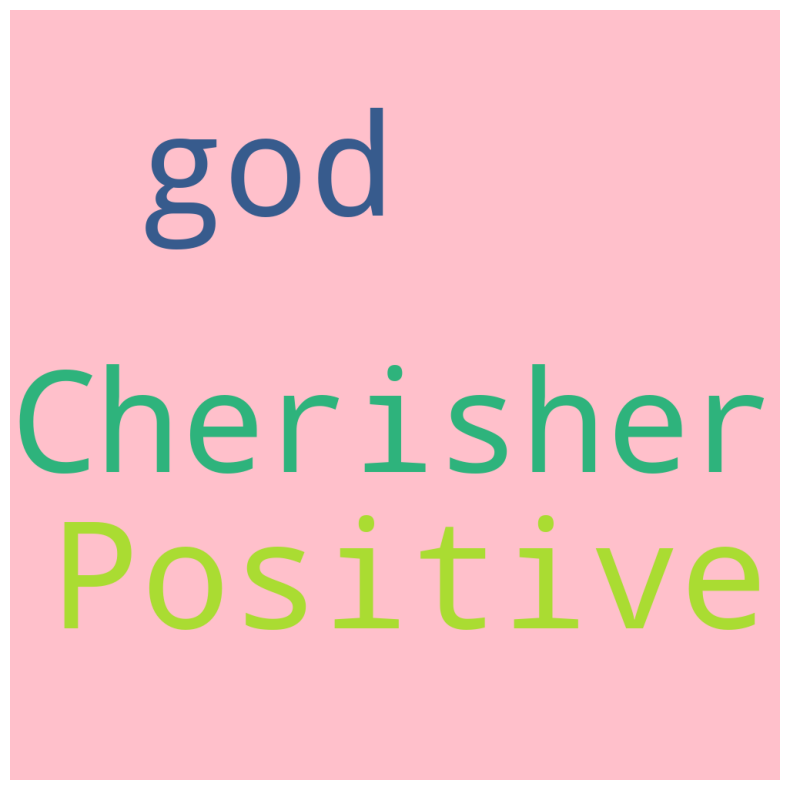

In [ ]:
#takes any chapter of the Quran and outputs a positive word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordQuran = Quran[113]
wordQuran = wordQuran.to_string()

for word in wordQuran.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

qposdf = pd.DataFrame (pos_word_list, columns = ['words'])

output15 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in qposdf.words:
        output15 += '{} '.format(line)

def plot_cloud(wordcloud15):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud15)
    plt.axis("off");
wordcloud15 = WordCloud(width = 1000, height = 1000, background_color='pink').generate(output15)
plot_cloud(wordcloud15)

print(pos_word_list)

t = str(pos_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()

['Negative', 'mischief']


words       
'mischief']     1
['Negative',    1
dtype: int64

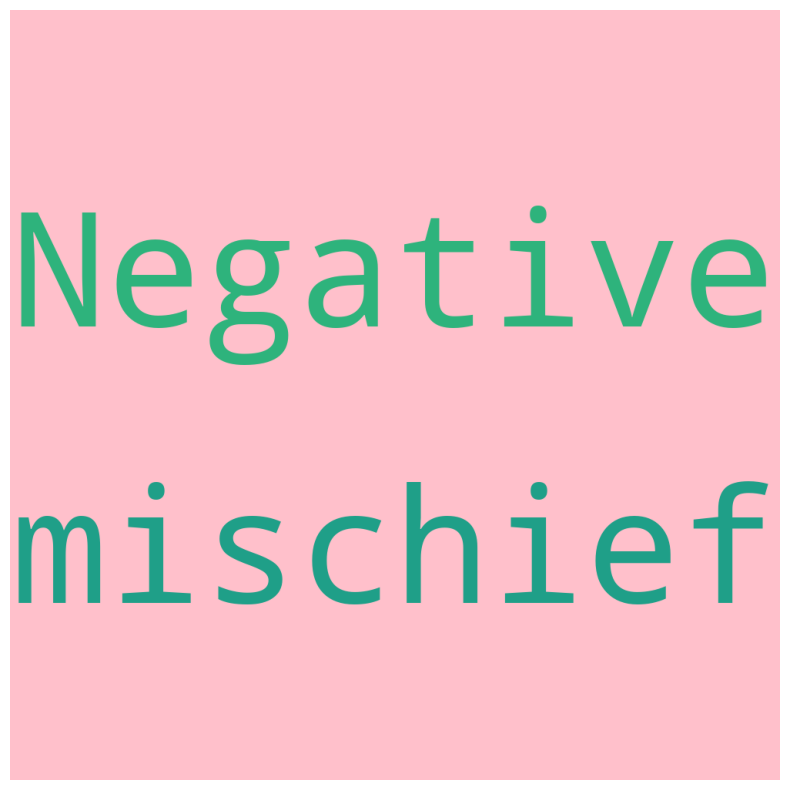

In [ ]:
#takes any chapter of the Quran and outputs a negative word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordQuran = Quran[113]
wordQuran = wordQuran.to_string()

for word in wordQuran.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

qnegdf = pd.DataFrame (neg_word_list, columns = ['words'])

output16 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in qnegdf.words:
        output16 += '{} '.format(line)

def plot_cloud(wordcloud16):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud16)
    plt.axis("off");
wordcloud16 = WordCloud(width = 1000, height = 1000, background_color='pink',collocations=False).generate(output16)
plot_cloud(wordcloud16)

print(neg_word_list)

t = str(neg_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()

['Positive', 'God', 'God,', 'Blessed', 'hand.', 'Grace', 'peace,', 'faithful', 'loved', 'God', 'glory', 'God,', 'great', 'like', 'like', 'like', 'hand', 'strength.', 'hand', 'alive', 'hand,', 'hand,', 'love.', 'paradise', 'God.', 'alive;', 'faithful', 'faith,', 'faithful', 'commit', 'God,', 'like', 'like', 'charity,', 'faith,', 'commit', 'commit', 'great', 'God,', 'strengthen', 'ready', 'perfect', 'God.', 'worthy.', 'true,', 'strength,', 'worship', 'loved', 'God,', 'God,', 'God,', 'heaven', 'God:', 'faithful', 'true', 'creation', 'God;', 'rich,', 'increased', 'rich;', 'love,', 'grant', 'heaven:', 'heaven,', 'like', 'like', 'God.', 'like', 'like', 'like', 'like', 'God', 'glory', 'honour', 'thanks', 'worship', 'worthy,', 'glory', 'honour', 'created', 'pleasure', 'created.', 'hand', 'strong', 'worthy', 'heaven,', 'worthy', 'God', 'hand', 'worthy', 'redeemed', 'God', 'God', 'Worthy', 'riches,', 'wisdom,', 'strength,', 'honour,', 'glory,', 'blessing.', 'heaven,', 'Blessing,', 'honour,', 'gl

words       
'great',        63
'God',          48
'God,',         30
'heaven,',      29
'like',         26
                ..
'True,',         1
'great;',        1
'Worthy',        1
'granted',       1
['Positive',     1
Length: 119, dtype: int64

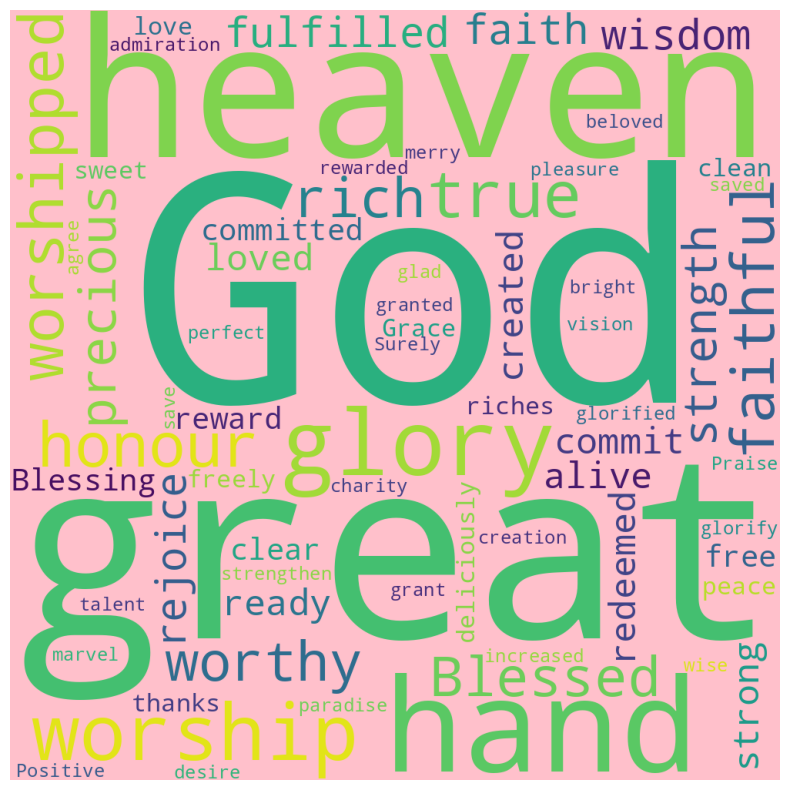

In [ ]:
# Splits Bible into a list of books

num_books = df3['book'].max()
Bible = [''] * num_books
for i in range(num_books):
  Bible[i] = df3[df3['book']==i+1]

# Bible
# df3[(df3['book']==1) & (df3['chapter']==2)]
first_book = Bible[0]
first_book_second_chapter = first_book[first_book['chapter']==2]
# first_book_second_chapter

#takes any book of the Bible and outputs a positive word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordBible = Bible[65]
wordBible = wordBible.to_string()

for word in wordBible.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

bposdf = pd.DataFrame (pos_word_list, columns = ['words'])

output17 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bposdf.words:
        output17 += '{} '.format(line)

def plot_cloud(wordcloud17):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud17)
    plt.axis("off");
wordcloud17 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output17)
plot_cloud(wordcloud17)

print(pos_word_list)

t = str(pos_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()


In [ ]:
# Splits Bible into a list of books

num_books = df3['book'].max()
Bible = [''] * num_books
for i in range(num_books):
  Bible[i] = df3[df3['book']==i+1]

# Bible
# df3[(df3['book']==1) & (df3['chapter']==2)]
first_book = Bible[18]
first_book_second_chapter = first_book[first_book['chapter']==2]
# first_book_second_chapter

#takes any book of the Bible and outputs a negative word cloud for it

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordBible = Bible[0]
wordBible = wordBible.to_string()

Negative darkness darkness. darkness darkness: evil. evil, die. alone; ashamed. die. die: evil. sorrow sorrow sorrow evil: fallen? 86 sin punishment kill hurt. died. died. died. died. died. died. died. died. wickedness evil grieved destroy violence. violence destroy lower, destroy die. destroy broken died died. 182 destroyed destroyed 187 no curse evil fear dread cut destroy no destroy died. died no died curse grievous kill no destroyed wicked war rebelled. battle enemies Fear no horror darkness no despised wrong despised cut broken stricken denied, cry sin grievous; cry destroy wicked? destroy wicked: wicked, lack destroy lack destroy angry, destroy angry, destroy wickedly. worse sore destroy cry destroy destroy mocked evil die: fire destroyed feared dead suffered die, sore offended sin? fear suck? mocking. grievous grievous death wept. fear violently ass, ass; fire fire enemies; died mourn weep dead, dead dead; dead. dead dead. dead dead. stricken bad hate death. ghost, died death gh

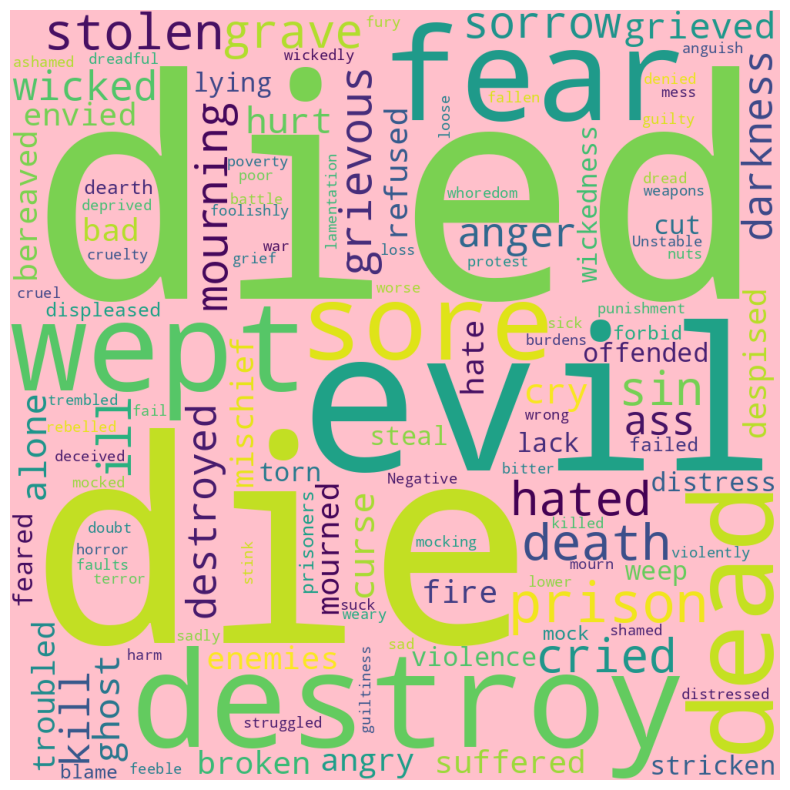

In [ ]:
for word in wordBible.split():
    # word = word.strip(".,:;?!")
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

bnegdf = pd.DataFrame (neg_word_list, columns = ['words'])

output18 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bnegdf.words:
        # output18 is a space-separated string of all words in bnegdf.words
        output18 += '{} '.format(line)

print(output18)

def plot_cloud(wordcloud18):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud18)
    plt.axis("off");
wordcloud18 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output18)
plot_cloud(wordcloud18)

# print(neg_word_list)

t = str(neg_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
# tt.value_counts()

['Negative', 'dead,', 'sins', 'fire;', 'dead.', 'Fear', 'dead;', 'hell', 'death.', 'evil:', 'liars:', 'fallen,', 'hate.', 'dead,', 'poverty,', 'Fear', 'suffer:', 'devil', 'prison,', 'death,', 'hurt', 'death.', 'denied', 'hate.', 'fight', 'no', 'fire,', 'kill', 'death;', 'burden.', 'broken', 'dead.', 'die:', 'thief,', 'no', 'no', 'no', 'denied', 'no', 'no', 'miserable,', 'poor,', 'blind,', 'fire,', 'shame', 'fire', 'loose', 'no', 'wept', 'no', 'Weep', 'loose', 'kill', 'hurt', 'Death,', 'Hell', 'kill', 'hunger,', 'death,', 'cried', 'killed', 'cried', 'hurt', 'Hurt', 'no', 'cried', 'hunger', 'no', 'fire', 'fire', 'fire', 'died;', 'destroyed.', 'died', 'bitter.', 'Woe,', 'woe,', 'woe,', 'hurt', 'kill', 'death,', 'die,', 'death', 'battle;', 'battle.', 'hurt', 'woe', 'woes', 'Loose', 'fire,', 'fire', 'killed,', 'fire,', 'hurt.', 'killed', 'devils,', 'murders,', 'fire:', 'cried', 'cried,', 'no', 'bitter,', 'bitter.', 'hurt', 'fire', 'enemies:', 'hurt', 'killed.', 'war', 'kill', 'dead', 'dead'

words       
'no',           40
'fire',         12
'dead',          9
'cried',         8
'war',           7
                ..
'broken',        1
'hateful',       1
'burden.',       1
'hate',          1
['Negative',     1
Length: 126, dtype: int64

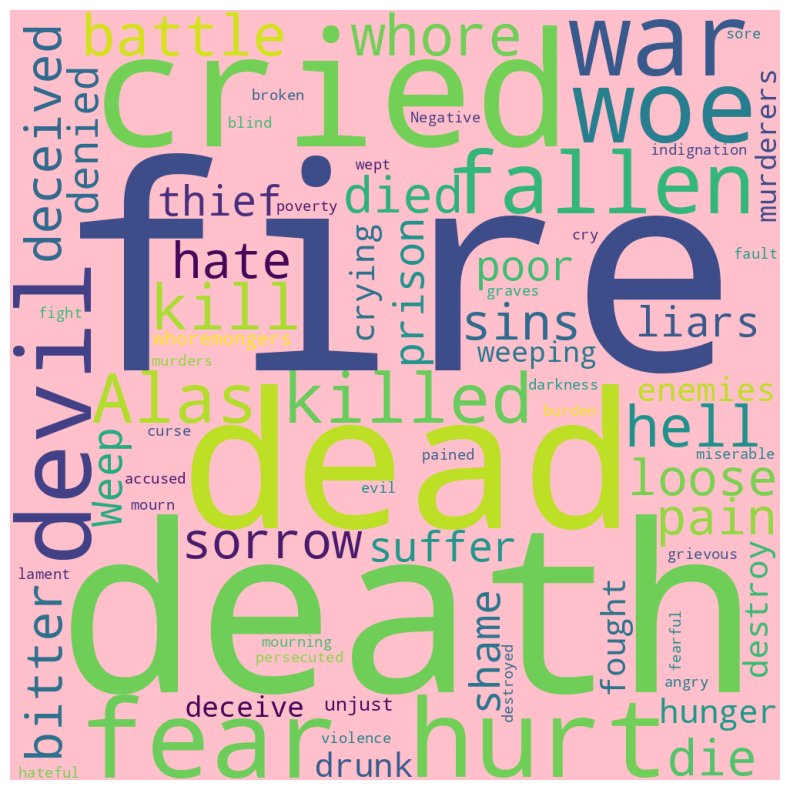

In [ ]:
# Splits Bible into a list of books

num_books = df3['book'].max()
Bible = [''] * num_books
for i in range(num_books):
  Bible[i] = df3[df3['book']==i+1]

# Bible
# df3[(df3['book']==1) & (df3['chapter']==2)]
first_book = Bible[0]
first_book_second_chapter = first_book[first_book['chapter']==2]
# first_book_second_chapter

#takes any book of the Bible and outputs a negative word cloud for it

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

wordBible = Bible[65]
wordBible = wordBible.to_string()

for word in wordBible.split():
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

bnegdf = pd.DataFrame (neg_word_list, columns = ['words'])

output18 = ''
# excludelist = [
# 'label', 'h4', 'ol', '[document]', 'a', 'h1', 'noscript', 'span', 'header', 'ul', 'html', 'section', 'article', 'em', 'meta', 'title', 'body', 'aside', 'footer', 'div', 'form', 'nav', 'p', 'head', 'link', 'strong', 'h6', 'br', 'li', 'h3',
# 'h5', 'input', 'blockquote', 'main', 'script', 'figure',
    # there may be more elements you don't want, such as "style", etc.
# ]

for line in bnegdf.words:
        output18 += '{} '.format(line)

def plot_cloud(wordcloud18):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud18)
    plt.axis("off");
wordcloud18 = WordCloud(width = 1000, height = 1000, background_color='pink', collocations=False).generate(output18)
plot_cloud(wordcloud18)

print(neg_word_list)

t = str(neg_word_list)
tt = pd.DataFrame (t.split(), columns = ['words'])
tt.value_counts()

DEMO_SENTIMENTANALYSES

In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [ ]:
d = df
d["row_id"] = d.index + 1
print (d.head(10))

   Chapter  Verse                                               Text Positive  \
0        1      1  Dhritarashtra spoke:  On the field of Dharma, ...      5.9   
1        1      2  Sanjaya spoke: Your son Duryodhana saw the arm...      0.0   
2        1      3  "My teacher, look at this magnificent army of ...     24.3   
3        1      4  There they are, warriors, great archers, all o...     29.3   
4        1      5  And Dhrstaketu and Cekitana and the king of Ka...     13.9   
5        1      6  Also there is that broad-striding Yudhamanyu, ...     28.6   
6        1      7  And now notice, O best of the twice-born Brahm...     12.7   
7        1      8  You yourself, my lord Drona, and Bhisma and Ka...     20.9   
8        1      9  And many other warriors willing to give up the...      0.0   
9        1     10  The strength of this army of ours is unmatched...     17.2   

  Neutral Negative  row_id  
0    87.9      6.2       1  
1    91.2      8.8       2  
2    75.7      0.0   

In [1]:
#create a new data frame with "id" and "comment" fields
d_subset = d[['row_id', 'Text']].copy()
#data clean-up
#remove all non-aphabet characters
d_subset['Text'] = d_subset['Text'].str.replace("[^a-zA-Z#]", " ")
#covert to lower-case
d_subset['Text'] = d_subset['Text'].str.casefold()
print (d_subset.head(10))

d1=pd.DataFrame()
d1['row_id']=['99999999999']
d1['sentiment_type']='NA999NA'
d1['sentiment_score']=0

print('Processing sentiment analysis...')
sid = SentimentIntensityAnalyzer()
t_d = d1
for index, row in d_subset.iterrows():
    scores = sid.polarity_scores(row[1])
    for key, value in scores.items():
        temp = [key,value,row[0]]
        d1['row_id']=row[0]
        d1['sentiment_type']=key
        d1['sentiment_score']=value
        t_d=t_d.append(d1)
#remove dummy row with row_id = 99999999999
t_d_cleaned = t_d[t_d.row_id != '99999999999']
#remove duplicates if any exist
t_d_cleaned = t_d_cleaned.drop_duplicates()
# only keep rows where sentiment_type = compound
t_d_cleaned = t_d[t_d.sentiment_type == 'compound']
# print(t_d_cleaned.head(10))

NameError: ignored

In [ ]:
#merge dataframes
d_output = pd.merge(d, t_d_cleaned, on='row_id', how='inner')
print(d_output.head(10))

   Chapter  Verse                                               Text Positive  \
0        1      1  Dhritarashtra spoke:  On the field of Dharma, ...      5.9   
1        1      2  Sanjaya spoke: Your son Duryodhana saw the arm...      0.0   
2        1      3  "My teacher, look at this magnificent army of ...     24.3   
3        1      4  There they are, warriors, great archers, all o...     29.3   
4        1      5  And Dhrstaketu and Cekitana and the king of Ka...     13.9   
5        1      6  Also there is that broad-striding Yudhamanyu, ...     28.6   
6        1      7  And now notice, O best of the twice-born Brahm...     12.7   
7        1      8  You yourself, my lord Drona, and Bhisma and Ka...     20.9   
8        1      9  And many other warriors willing to give up the...      0.0   
9        1     10  The strength of this army of ours is unmatched...     17.2   

  Neutral Negative  row_id sentiment_type  sentiment_score  
0    87.9      6.2       1       compound      

In [ ]:
d_output[["sentiment_score"]].describe()

,sentiment_score
count,700.000000
mean,0.219767
std,0.544720
min,-0.959500
25%,-0.104875
50%,0.326100
75%,0.690800
max,0.983600


<Axes: title={'center': 'Sentiment Score'}, xlabel='Chapter', ylabel='Mean Sentiment Score'>

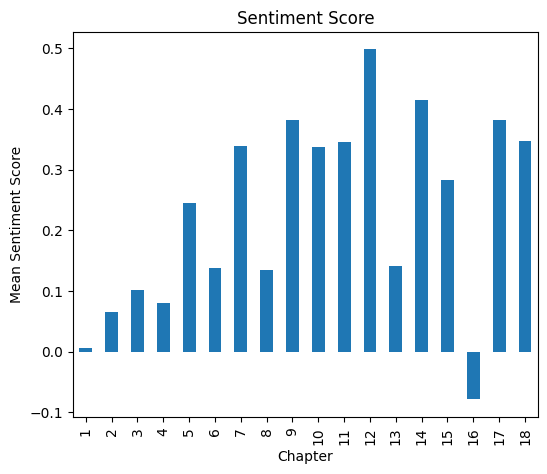

In [ ]:
#generate mean of sentiment_score by period
dfg = d_output.groupby(['Chapter'])['sentiment_score'].mean()
#create a bar plot
dfg.plot(kind='bar', title='Sentiment Score', ylabel='Mean Sentiment Score',
         xlabel='Chapter', figsize=(6, 5))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, '1'),
  Text(1, 0, '2'),
  Text(2, 0, '3'),
  Text(3, 0, '4'),
  Text(4, 0, '5'),
  Text(5, 0, '6'),
  Text(6, 0, '7'),
  Text(7, 0, '8'),
  Text(8, 0, '9'),
  Text(9, 0, '10'),
  Text(10, 0, '11'),
  Text(11, 0, '12'),
  Text(12, 0, '13'),
  Text(13, 0, '14'),
  Text(14, 0, '15'),
  Text(15, 0, '16'),
  Text(16, 0, '17'),
  Text(17, 0, '18')])

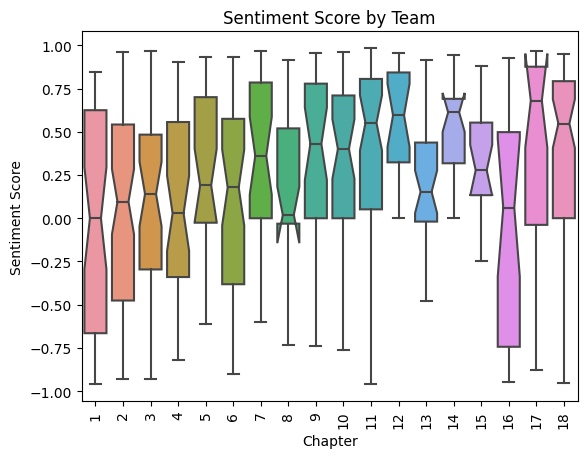

In [ ]:
import seaborn as sns
#create seaborn boxplots by group
sns.boxplot(x='Chapter', y='sentiment_score', notch = True,
            data=d_output, showfliers=False).set(title='Sentiment Score by Team')
#modify axis labels
plt.xlabel('Chapter')
plt.ylabel('Sentiment Score')
plt.xticks(rotation=90)

The below code attempts to do the same thing with the Qur'an.

In [ ]:
d2= df2
d2["row_id"] = d2.index + 1
print (d2.head(10))

   Surah  Ayah                                               Text Positive  \
0      1     1  In the name of Allah, Most Gracious, Most Merc...     32.7   
1      1     2  Praise be to Allah, the Cherisher and Sustaine...     43.0   
2      1     3                      Most Gracious, Most Merciful;     56.5   
3      1     4                     Master of the Day of Judgment.      0.0   
4      1     5         Thee do we worship, and Thine aid we seek.     21.6   
5      1     6                          Show us the straight way,     32.2   
6      1     7  The way of those on whom Thou hast bestowed Th...     11.8   
7      2     1                                           A. L. M.      0.0   
8      2     2  This is the Book; in it is guidance sure, with...     21.4   
9      2     3  Who believe in the Unseen, are steadfast in pr...     10.0   

  Neutral Negative  row_id  
0    67.3      0.0       1  
1    57.0      0.0       2  
2    43.5      0.0       3  
3   100.0      0.0       

In [ ]:
#create a new data frame with "id" and "comment" fields
d2_subset = d2[['row_id', 'Text']].copy()
#data clean-up
#remove all non-aphabet characters
d2_subset['Text'] = d2_subset['Text'].str.replace("[^a-zA-Z#]", " ")
#covert to lower-case
d2_subset['Text'] = d2_subset['Text'].str.casefold()
print (d2_subset.head(10))

d21=pd.DataFrame()
d21['row_id']=['99999999999']
d21['sentiment_type']='NA999NA'
d21['sentiment_score']=0

print('Processing sentiment analysis...')
sid = SentimentIntensityAnalyzer()
t_d = d21
for index, row in d2_subset.iterrows():
    scores = sid.polarity_scores(row[1])
    for key, value in scores.items():
        temp = [key,value,row[0]]
        d21['row_id']=row[0]
        d21['sentiment_type']=key
        d21['sentiment_score']=value
        t_d=t_d.append(d21)
#remove dummy row with row_id = 99999999999
t_d_cleaned = t_d[t_d.row_id != '99999999999']
#remove duplicates if any exist
t_d_cleaned = t_d_cleaned.drop_duplicates()
# only keep rows where sentiment_type = compound
t_d_cleaned = t_d[t_d.sentiment_type == 'compound']
print(t_d_cleaned.head(10))

   row_id                                               Text
0       1  in the name of allah  most gracious  most merc...
1       2  praise be to allah  the cherisher and sustaine...
2       3                      most gracious  most merciful 
3       4                     master of the day of judgment 
4       5         thee do we worship  and thine aid we seek 
5       6                          show us the straight way 
6       7  the way of those on whom thou hast bestowed th...
7       8                                           a  l  m 
8       9  this is the book  in it is guidance sure  with...
9      10  who believe in the unseen  are steadfast in pr...
Processing sentiment analysis...


Streaming output truncated to the last 5000 lines.
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append

   row_id sentiment_type  sentiment_score
0       1       compound           0.5984
0       2       compound           0.7783
0       3       compound           0.5984
0       4       compound           0.0000
0       5       compound           0.2960
0       6       compound           0.2263
0       7       compound           0.4215
0       8       compound           0.0000
0       9       compound           0.0541
0      10       compound           0.2500


<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_d=t_d.append(d21)
<ipython-input-99-4bc5e6f357fe>:25: FutureWar

In [ ]:
#merge dataframes
d2_output = pd.merge(d2, t_d_cleaned, on='row_id', how='inner')
print(d2_output.head(10))

   Surah  Ayah                                               Text Positive  \
0      1     1  In the name of Allah, Most Gracious, Most Merc...     32.7   
1      1     2  Praise be to Allah, the Cherisher and Sustaine...     43.0   
2      1     3                      Most Gracious, Most Merciful;     56.5   
3      1     4                     Master of the Day of Judgment.      0.0   
4      1     5         Thee do we worship, and Thine aid we seek.     21.6   
5      1     6                          Show us the straight way,     32.2   
6      1     7  The way of those on whom Thou hast bestowed Th...     11.8   
7      2     1                                           A. L. M.      0.0   
8      2     2  This is the Book; in it is guidance sure, with...     21.4   
9      2     3  Who believe in the Unseen, are steadfast in pr...     10.0   

  Neutral Negative  row_id sentiment_type  sentiment_score  
0    67.3      0.0       1       compound           0.5984  
1    57.0      0.0 

In [ ]:
d2_output[["sentiment_score"]].describe()

,sentiment_score
count,6236.00000
mean,0.06883
std,0.52855
min,-0.98160
25%,-0.35060
50%,0.00000
75%,0.52670
max,0.99310


<Axes: title={'center': 'Sentiment Score'}, xlabel='Surah', ylabel='Mean Sentiment Score'>

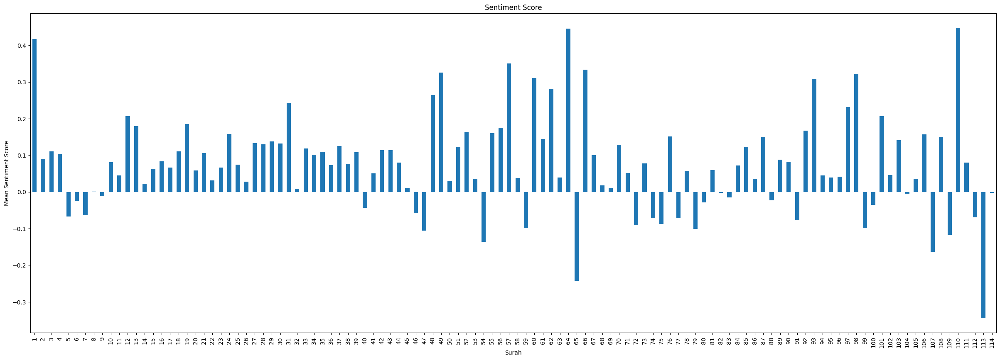

In [ ]:
#generate mean of sentiment_score by period
dfg2 = d2_output.groupby(['Surah'])['sentiment_score'].mean()
#create a bar plot
dfg2.plot(kind='bar', title='Sentiment Score', ylabel='Mean Sentiment Score',
         xlabel='Surah', figsize=(30, 10))

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113]),
 [Text(0, 0, '1'),
  Text(1, 0, '2'),
  Text(2, 0, '3'),
  Text(3, 0, '4'),
  Text(4, 0, '5'),
  Text(5, 0, '6'),
  Text(6, 0, '7'),
  Text(7, 0, '8'),
  Text(8, 0, '9'),
  Text(9, 0, '10'),
  Text(10, 0, '11'),
  Text(11, 0, '12'),
  Text(12, 0, '13'),
  Text(13, 0, '14'),
  Text(14, 0, '15'),
  Text(15, 0, '16'),
  Text(16, 0, '17'),
  Text(17, 0, '18'

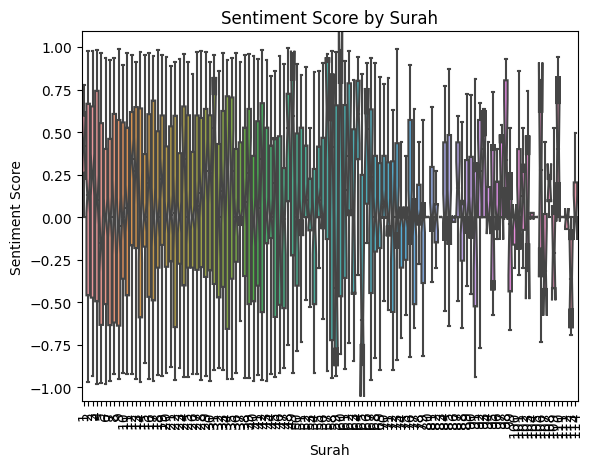

In [ ]:
import seaborn as sns
#create seaborn boxplots by group
sns.boxplot(x='Surah', y='sentiment_score', notch = True,
            data=d2_output, showfliers=False).set(title='Sentiment Score by Surah')
#modify axis labels
plt.xlabel('Surah')
plt.ylabel('Sentiment Score')
plt.xticks(rotation=90)

NEXT SECTION: Parsing Sentences

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from google.colab import files
from scipy import stats
import random
import copy

NEXT SECTION: SEMANTIC SIMILARITY

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from scipy import stats
import random
import copy


In [ ]:
pip install -U sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 56.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.6 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125923 sha256=3575dbecc6edcd3daf37a92e3b24d43a3b6c36e2f739a1b2a578ed3d4efc7b68
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


In [ ]:
pip install torch torchvision torchaudio


In [ ]:
pip install transformers


In [ ]:
pip install sentence-transformers

In [ ]:
from sentence_transformers import SentenceTransformer, util


In [ ]:
model = SentenceTransformer('stsb-roberta-large')

In [ ]:
sentence1 = df.Text[0]
sentence2 = df2.Text[0]

# encode sentences to get their embeddings
embedding1 = model.encode(sentence1, convert_to_tensor=True)
embedding2 = model.encode(sentence2, convert_to_tensor=True)

# compute similarity scores of two embeddings
cosine_scores = util.pytorch_cos_sim(embedding1, embedding2)
print("Sentence 1:", sentence1)
print("Sentence 2:", sentence2)
print("Similarity score:", cosine_scores.item())

Sentence 1: Dhritarashtra spoke:  On the field of Dharma, on the field of the Kurus, they have assembled and are eager to fight, my men on one side and the sons of Pandu on the other. What did they do, Sanjaya?
Sentence 2: In the name of Allah, Most Gracious, Most Merciful.
Similarity score: -0.10193862020969391


In [ ]:
sentences1 = [df.Text[0],
          df.Text[1]]
sentences2 = [df2.Text[0], df2.Text[1]]
# encode list of sentences to get their embeddings
embedding1 = model.encode(sentences1, convert_to_tensor=True)
embedding2 = model.encode(sentences2, convert_to_tensor=True)
# compute similarity scores of two embeddings
cosine_scores = util.pytorch_cos_sim(embedding1, embedding2)
for i in range(len(sentences1)):
    for j in range(len(sentences2)):
        print("Sentence 1:", sentences1[i])
        print("Sentence 2:", sentences2[j])
        print("Similarity Score:", cosine_scores[i][j].item())
        print()

Sentence 1: Dhritarashtra spoke:  On the field of Dharma, on the field of the Kurus, they have assembled and are eager to fight, my men on one side and the sons of Pandu on the other. What did they do, Sanjaya?
Sentence 2: In the name of Allah, Most Gracious, Most Merciful.
Similarity Score: -0.10193862020969391

Sentence 1: Dhritarashtra spoke:  On the field of Dharma, on the field of the Kurus, they have assembled and are eager to fight, my men on one side and the sons of Pandu on the other. What did they do, Sanjaya?
Sentence 2: Praise be to Allah, the Cherisher and Sustainer of the worlds;
Similarity Score: -0.059523940086364746

Sentence 1: Sanjaya spoke: Your son Duryodhana saw the army of the Pandavas drawn up for battle, and then he, the king, approached his teacher, Drona, and spoke these words:
Sentence 2: In the name of Allah, Most Gracious, Most Merciful.
Similarity Score: -0.07936901599168777

Sentence 1: Sanjaya spoke: Your son Duryodhana saw the army of the Pandavas draw

Below we take 3 sentences from a source passage and 1 sentence from a target passage, and ask which sentences from the source are most similar to the target.

In [ ]:
corpus = [str(df.Text.iloc[300]), str(df.Text.iloc[458]), str(df.Text.iloc[111])
]
# encode corpus to get corpus embeddings
corpus_embeddings = model.encode(corpus, convert_to_tensor=True)
sentence = "I was told from heaven that there are four special styles of the old Testament."
# encode sentence to get sentence embeddings
sentence_embedding = model.encode(sentence, convert_to_tensor=True)
# top_k results to return
top_k=2
# compute similarity scores of the sentence with the corpus
cos_scores = util.pytorch_cos_sim(sentence_embedding, corpus_embeddings)[0]
# Sort the results in decreasing order and get the first top_k
top_results = np.argpartition(-cos_scores, range(top_k))[0:top_k]
print("Sentence:", sentence, "\n")
print("Top", top_k, "most similar sentences in corpus:")
for idx in top_results[0:top_k]:
    print(corpus[idx], "(Score: %.4f)" % (cos_scores[idx]))

Sentence: I was told from heaven that there are four special styles of the old Testament. 

Top 2 most similar sentences in corpus:
I will give unshakable faith to any devotee who wishes to worship god in any form, as long as he worships with fervent faith. (Score: 0.3092)
I have seen what no one else has seen before, and I am exhilarated, but my mind is shaken with fear. Krsna, please show me once again that body that I know so well. Lord of the gods, the world's refuge, be gracious! (Score: 0.1965)


In [ ]:

corpus = [str(Gita[4].Text.iloc[:]), str(Quran[4].Text.iloc[:])
]
# encode corpus to get corpus embeddings
corpus_embeddings = model.encode(corpus, convert_to_tensor=True)
sentence = "I can do all things through Christ who strengthens me."
# encode sentence to get sentence embeddings
sentence_embedding = model.encode(sentence, convert_to_tensor=True)
# top_k results to return
top_k=2
# compute similarity scores of the sentence with the corpus
cos_scores = util.pytorch_cos_sim(sentence_embedding, corpus_embeddings)[0]
# Sort the results in decreasing order and get the first top_k
top_results = np.argpartition(-cos_scores, range(top_k))[0:top_k]
print("Sentence:", sentence, "\n")
print("Top", top_k, "most similar sentences in corpus:")
for idx in top_results[0:top_k]:
    print(corpus[idx], "(Score: %.4f)" % (cos_scores[idx]))

Sentence: I can do all things through Christ who strengthens me. 

Top 2 most similar sentences in corpus:
204    Arjuna spoke: You praise the renunciation of a...
205    The Blessed One spoke: Renunciation of action ...
206    One who does not hate and who does not desire ...
207    It is only the foolish who declare that Sankhy...
208    Practitioners of yoga arrive at the same posit...
209    But, Arjuna, renunciation is difficult to atta...
210    Once he becomes disciplined in yoga, the self ...
211    "I who am not doing anything," he should think...
212    he talks, he relieves himself, he takes with h...
213    He gives his actions over to infinite Brahman ...
214    Yogins perform actions with body and mind and ...
215    The undisciplined man is attached to the fruit...
216    In his mind he renounces all actions. The embo...
217    The lord does not engender the world's agency ...
218    The ever-present lord does not take on the eff...
219    But whenever this ignorance amo

In [ ]:
cloister = str(df.Text.iloc[300])
cloister

'I will give unshakable faith to any devotee who wishes to worship god in any form, as long as he worships with fervent faith.'

In [ ]:
cloister2 = str(df.Text)
print (cloister2)

0      Dhritarashtra spoke:  On the field of Dharma, ...
1      Sanjaya spoke: Your son Duryodhana saw the arm...
2      "My teacher, look at this magnificent army of ...
3      There they are, warriors, great archers, all o...
4      And Dhrstaketu and Cekitana and the king of Ka...
                             ...                        
695    Sanjaya spoke: Thus I have heard this astonish...
696    I have heard this supreme secret doctrine by t...
697    O king, I remember, I memorize, this astonishi...
698    And I remember, I memorize also, that wonderfu...
699    Wherever Krsna, the lord of yoga, is, and wher...
Name: Text, Length: 700, dtype: object


In [ ]:
list(Gita[10].Text)

['Arjuna spoke: As a kindness to me, you have explained the sublime secret doctrine concerning the self. Your words have freed me from my delusion.',
 'Indeed, O Krsna, you whose eyes are like lotus petals and whose greatness is unending--I have heard from you in detail of the arising and the passing away of all beings!',
 'I want to see you as you have described yourself, Krsna, in your true form, as the lord of the world, for you are the supreme Spirit.',
 'If you think that it is possible for me to see you as you really are, lord and master of yoga, then please show your eternal self to me!',
 'The Blessed One spoke: Arjuna, look at the forms that I take, hundreds of them and thousands of them! So many divine forms! So many colors and so many shapes!',
 'Look at them all: gods of heaven, gods of light, terrifying gods; the celestial twins and the storm gods. Look at these wonders, Arjuna, so many, never seen before!',
 'Look now at this whole world, here in one place, both what move

venn diagrams

In [ ]:
pip install matplotlib-venn

In [ ]:
from matplotlib_venn import venn2, venn2_circles, venn3, venn3_circles

In [ ]:
ivenn2_circles(subsets = (1, 1, .5))

NameError: ignored

In [ ]:
import nltk
nltk.download('punkt')

from nltk import tokenize
p = str(df.Text)

tokenize.sent_tokenize(p)


In [ ]:
split(Gita[4].Text)

In [ ]:
for i in df.Text:
  print (i)


##Rolling Averages, Total Emotionality, Net Sentiment

The following bits of code are used to plot rolling averages (means) in positivity and negativity, along with two more measures: **Total Emotionality**, the sum of Positivity + Negativity percentages.  The other is **Net Sentiment**, Positivity - Negativity percentages.  

For the **rolling averages** there is a variable called **grain** that determines the size of the rolling window.  For example if the window size is 100, then this measure starts at the 100th step (verse 100, sentence 100 ... whatever the basic unit of analysis is) and calculates the average score for 1-100, then at the next step it calculates the average score for 2-101, 3-102, 4-103, etc.  This measure helps us spot overall trends by smoothing away the "noise" of individual units.

The example below uses the Quran (df2).  (in the future it might be a good idea to find-and-replace all the instances of "df" with more specific labels, e.g. dfG for Gita, dfQ for Quran, dfB for Bible).  It should be easily modified for the other holy texts.    

In [ ]:
import statistics #used for calculating means

In [ ]:
# Net Sentiment is calculated as Positive minus Negative, Pos_m_Neg
# Total Emotionality is calculated Positive plus Negative, Pos_p_Neg
df2['Pos_m_Neg'] = ''
df2['Pos_p_Neg'] = ''

for index, row in df2.iterrows():
    df2.at[index,'Pos_p_Neg'] = df2.at[index,'Positive'] + df2.at[index, 'Negative']
    df2.at[index,'Pos_m_Neg'] = df2.at[index,'Positive'] - df2.at[index, 'Negative']



df2['SmoothPos'] = ''
df2['SmoothNeg'] = ''
df2['SmoothSum'] = ''
df2['SmoothDif'] = ''


howbig = len(df2.Positive)

grain = 250
for i in range(grain, howbig):
  posgroup = df2.Positive[(i-grain):i]
  df2.at[i,'SmoothPos'] = statistics.mean(posgroup)
  neggroup = df2.Negative[(i-grain):i]
  df2.at[i,'SmoothNeg'] = statistics.mean(neggroup)
  neggroup = df2.Pos_p_Neg[(i-grain):i]
  df2.at[i,'SmoothSum'] = statistics.mean(neggroup)
  neggroup = df2.Pos_m_Neg[(i-grain):i]
  df2.at[i,'SmoothDif'] = statistics.mean(neggroup)

# the following few lines are an awkward hack to reformat these data in a way that is friendly to plotting
PosSmooth = list(df2['SmoothPos'])
NegSmooth = list(df2['SmoothNeg'])
SumSmooth = list(df2['SmoothSum'])
DifSmooth = list(df2['SmoothDif'])

plt.plot(PosSmooth[grain:], label = "Positive")
plt.plot(NegSmooth[grain:], label = "Negative")

plt.legend()

In [ ]:
plt.plot(SumSmooth[grain:], label = "Total Emotionality")
plt.plot(DifSmooth[grain:], label = "Net Sentiment")

plt.legend()

#Histograms of Sentiment Distribution
The following figures make histograms plotting the total frequency of Positive and Negative sentiment percentages.  These figures ignore the order, and simply count how many units exhibit a given amount of emotion.  For example, lots of units have 0% Negativity, and the first bar above the X axis shows how many fall between 0% and 5% Negativity (or Positivity).  

In [ ]:
plt.hist(df.loc[:,"Positive"], alpha =0.5, label = "Positive")
plt.hist(df.loc[:,"Negative"], alpha = 0.5, label = "Negative")
plt.legend(loc='upper right')
plt.title('Bhagavad-Gita')

In [ ]:
plt.hist(df2.loc[:,"Positive"], alpha =0.5, label = "Positive")
plt.hist(df2.loc[:,"Negative"], alpha = 0.5, label = "Negative")
plt.legend(loc='upper right')
plt.title('Quran')

#Scatterplot
Each point is one verse, plotted by the magnitude of emotion prevelance on two dimensions: Positive & Negative.  This is example uses the Quran, df2.

In [ ]:
x = df['Positive']
y = df['Negative']

plot(x,y,"k.", alpha = 0.4)
plt.title('Gita')

In [ ]:
x = df2['Positive']
y = df2['Negative']

plot(x,y,"k.", alpha = 0.1)
plt.title('Quran')